In [106]:
import pandas as pd
from math import sqrt
import numpy as np #linear algebra
import pandas as pd #data manipulation and analysis
import seaborn as sns #data visualization
import matplotlib.pyplot as plt #data visualization
import sklearn.preprocessing as skp #machine learning (preprocessing)
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier, BaggingRegressor
from sklearn.preprocessing import scale, OneHotEncoder, LabelEncoder, RobustScaler, MinMaxScaler, StandardScaler
from sklearn.decomposition import PCA
from sklearn.linear_model import SGDClassifier
from sklearn.compose import make_column_transformer
import sklearn.cluster as skc #machine learning (clustering)
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error, make_scorer
import warnings # ignore warnings
from sklearn.linear_model import Ridge
from sklearn.linear_model import LassoCV, Lasso, RidgeCV
from sklearn.neighbors import KNeighborsRegressor
from sklearn.model_selection import KFold, cross_val_score, GridSearchCV, train_test_split, RandomizedSearchCV
from sklearn.feature_selection import SelectKBest, f_classif
import sklearn.model_selection as ms
from scipy.stats import spearmanr
from sklearn.tree import DecisionTreeRegressor
import warnings # ignore warnings
warnings.filterwarnings('ignore')

In [2]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', None) 

In [3]:
df2018 = pd.read_csv('output2018.csv')

# EDA

On a 43 colonnes et 3335292 rows pour l'année 2018
Ce dataset permet de connaître les transactions immobilières intervenues au cours de l'année 2018
Target Value -> Valeur fonciere               


Les fichiers de restitution des valeurs foncières sont organisés de la manière suivante :

• identification de chaque mutation par son numéro de disposition ;

• affichage d’une ligne par local ;

• pour chaque local (chaque ligne), les lots de l’immeuble correspondant (dans la
limite de 5) sont affichés ainsi que le nombre total de lots pour cet immeuble

• la surface réelle est associée au local ;

• restitution de la surface CARREZ associée au lot lorsqu’elle est indiquée.

Surface du terrain : Il s'agit de la superficie totale d'un terrain, mesurée en mètres carrés (m²) ou dans d'autres unités de surface. Cela inclut l'ensemble de la parcelle de terrain, y compris les espaces non construits tels que les jardins, les cours, les allées, etc. La surface du terrain est généralement mentionnée dans les actes de propriété ou les documents cadastraux.

Surface bâtie réelle : Il s'agit de la superficie effective de tous les bâtiments construits sur le terrain. Cette mesure exclut généralement les murs extérieurs, les balcons, les terrasses, les espaces non couverts, les sous-sols non aménagés, les combles non habitables, etc. La surface bâtie réelle est souvent utilisée pour déterminer la superficie utilisable d'un bâtiment et peut être indiquée dans les plans d'architecture ou les expertises immobilières.

Surface Carrez : La surface Carrez est une mesure spécifique à la France et elle concerne les biens immobiliers en copropriété. La surface Carrez exclut les murs, les cloisons, les embrasures de portes et de fenêtres, les gaines, les cages d'escalier, etc. Elle mesure la superficie au sol des pièces principales, y compris les murs intérieurs.

La valeur foncière : Le prix ou la valeur d'un terrain ou d'une propriété, sans tenir compte des constructions ou des améliorations qui y sont apportées. 

Il est important de noter que pour une même transaction (Jardin et Maison par exemple) il y aura une ligne différente par entité

In [4]:
#Check Types of columns 
df2018.dtypes

Identifiant de document       float64
Reference document            float64
1 Articles CGI                float64
2 Articles CGI                float64
3 Articles CGI                float64
4 Articles CGI                float64
5 Articles CGI                float64
No disposition                  int64
Date mutation                  object
Nature mutation                object
Valeur fonciere                object
No voie                       float64
B/T/Q                          object
Type de voie                   object
Code voie                      object
Voie                           object
Code postal                   float64
Commune                        object
Code departement               object
Code commune                    int64
Prefixe de section            float64
Section                        object
No plan                         int64
No Volume                      object
1er lot                        object
Surface Carrez du 1er lot      object
2eme lot    

In [5]:
# Changer types de certaines colonnes

df2018['Valeur fonciere'] = df2018['Valeur fonciere'].str.replace(',', '.').astype(float)
df2018['Surface Carrez du 1er lot'] = df2018['Surface Carrez du 1er lot'].str.replace(',', '.').astype(float)
df2018['Surface Carrez du 2eme lot'] = df2018['Surface Carrez du 2eme lot'].str.replace(',', '.').astype(float)
df2018['Surface Carrez du 3eme lot'] = df2018[  'Surface Carrez du 3eme lot'].str.replace(',', '.').astype(float)
df2018[ 'Surface Carrez du 4eme lot'] = df2018[ 'Surface Carrez du 4eme lot'].str.replace(',', '.').astype(float)
df2018['Surface Carrez du 5eme lot'] = df2018['Surface Carrez du 5eme lot'].str.replace(',', '.').astype(float)

In [7]:
#Regarder le types de chaque colonne

df2018.dtypes

Identifiant de document       float64
Reference document            float64
1 Articles CGI                float64
2 Articles CGI                float64
3 Articles CGI                float64
4 Articles CGI                float64
5 Articles CGI                float64
No disposition                  int64
Date mutation                  object
Nature mutation                object
Valeur fonciere               float64
No voie                       float64
B/T/Q                          object
Type de voie                   object
Code voie                      object
Voie                           object
Code postal                   float64
Commune                        object
Code departement               object
Code commune                    int64
Prefixe de section            float64
Section                        object
No plan                         int64
No Volume                      object
1er lot                        object
Surface Carrez du 1er lot     float64
2eme lot    

# Handling Missing Values

In [7]:
nan_counts = df2018.isna().sum()

In [9]:
print("\nNaN counts:")
nan_counts.sort_values(ascending = False)


NaN counts:


Identifiant de document       3335292
4 Articles CGI                3335292
Reference document            3335292
5 Articles CGI                3335292
Identifiant local             3335292
3 Articles CGI                3335292
2 Articles CGI                3335292
1 Articles CGI                3335292
Surface Carrez du 5eme lot    3334524
Surface Carrez du 4eme lot    3333418
5eme lot                      3329252
Surface Carrez du 3eme lot    3328253
No Volume                     3325298
4eme lot                      3322508
3eme lot                      3298632
Surface Carrez du 2eme lot    3264374
B/T/Q                         3190388
Prefixe de section            3190237
Nature culture speciale       3181060
2eme lot                      3116984
Surface Carrez du 1er lot     3045672
1er lot                       2296687
Surface reelle bati           1505342
Nombre pieces principales     1505342
Type local                    1502508
Code type local               1502508
Type de voie

In [11]:
#On regarde le pourcentage de données nulles pour chaques colonnes

nan_percentage = (nan_counts / len(df2018)) * 100
print("NaN percentage:")
nan_percentage.sort_values(ascending = False)

NaN percentage:


Identifiant de document       100.000000
4 Articles CGI                100.000000
Reference document            100.000000
5 Articles CGI                100.000000
Identifiant local             100.000000
3 Articles CGI                100.000000
2 Articles CGI                100.000000
1 Articles CGI                100.000000
Surface Carrez du 5eme lot     99.976974
Surface Carrez du 4eme lot     99.943813
5eme lot                       99.818906
Surface Carrez du 3eme lot     99.788954
No Volume                      99.700356
4eme lot                       99.616705
3eme lot                       98.900846
Surface Carrez du 2eme lot     97.873709
B/T/Q                          95.655433
Prefixe de section             95.650906
Nature culture speciale        95.375757
2eme lot                       93.454606
Surface Carrez du 1er lot      91.316502
1er lot                        68.860148
Surface reelle bati            45.133739
Nombre pieces principales      45.133739
Type local      

In [12]:
#On décide de retirer les colonnes qui possèdent 100% de données nulles/ Elles sont inexploitables 

threshold = 100

columns_above_threshold = nan_percentage[nan_percentage >= threshold].index.tolist()

print("Columns with NaN percentage above", threshold, "percent:")
print(columns_above_threshold)

Columns with NaN percentage above 100 percent:
['Identifiant de document', 'Reference document', '1 Articles CGI', '2 Articles CGI', '3 Articles CGI', '4 Articles CGI', '5 Articles CGI', 'Identifiant local']


In [13]:
#Drop ceux qui ont 100% de valeurs nulles

df2018 = df2018.drop(columns = columns_above_threshold)

In [14]:
#Creation d'une nouvelle colonne Adresse

df2018['Adresse'] = df2018['Type de voie'].astype(str) + ' ' + df2018['Code voie'].astype(str) + ' ' + df2018['Voie'].astype(str) + ' ' + df2018['Code postal'].astype(str) + ' ' + df2018['Commune'].astype(str) + ' ' + df2018['Code departement'].astype(str) + ' ' + df2018['Code commune'].astype(str)

In [15]:
df2018

,No disposition,Date mutation,Nature mutation,Valeur fonciere,No voie,B/T/Q,Type de voie,Code voie,Voie,Code postal,Commune,Code departement,Code commune,Prefixe de section,Section,No plan,No Volume,1er lot,Surface Carrez du 1er lot,2eme lot,Surface Carrez du 2eme lot,3eme lot,Surface Carrez du 3eme lot,4eme lot,Surface Carrez du 4eme lot,5eme lot,Surface Carrez du 5eme lot,Nombre de lots,Code type local,Type local,Surface reelle bati,Nombre pieces principales,Nature culture,Nature culture speciale,Surface terrain,Adresse
0,1,03/01/2018,Vente,109000.0,13.0,NaN,RUE,1660,GEN LOGEROT,1000.0,BOURG-EN-BRESSE,1,53,NaN,AN,73,NaN,1,NaN,31.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2,2.0,Appartement,73.0,4.0,NaN,NaN,NaN,RUE 1660 GEN LOGEROT 1000.0 BOURG-EN-BRESSE 1 53
1,1,03/01/2018,Vente,109000.0,13.0,NaN,RUE,1660,GEN LOGEROT,1000.0,BOURG-EN-BRESSE,1,53,NaN,AN,73,NaN,13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,3.0,Dépendance,0.0,0.0,NaN,NaN,NaN,RUE 1660 GEN LOGEROT 1000.0 BOURG-EN-BRESSE 1 53
2,1,04/01/2018,Vente,239300.0,4.0,NaN,RUE,0025,DE LA BARMETTE,1250.0,NIVIGNE ET SURAN,1,95,NaN,AH,186,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,1.0,Maison,163.0,4.0,S,NaN,949.0,RUE 0025 DE LA BARMETTE 1250.0 NIVIGNE ET SURAN 1 95
3,1,04/01/2018,Vente,239300.0,4.0,NaN,RUE,0025,DE LA BARMETTE,1250.0,NIVIGNE ET SURAN,1,95,NaN,AH,186,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,1.0,Maison,163.0,4.0,AG,JARD,420.0,RUE 0025 DE LA BARMETTE 1250.0 NIVIGNE ET SURAN 1 95
4,1,04/01/2018,Vente,239300.0,4.0,NaN,RUE,0025,DE LA BARMETTE,1250.0,NIVIGNE ET SURAN,1,95,NaN,AH,186,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,1.0,Maison,51.0,2.0,AG,JARD,420.0,RUE 0025 DE LA BARMETTE 1250.0 NIVIGNE ET SURAN 1 95
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3335287,1,28/12/2018,Vente,1192307.0,1.0,NaN,PAS,2012,CHOISEUL,75002.0,PARIS 02,75,102,NaN,AD,118,NaN,43.0,120.54,44.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2,2.0,Appartement,150.0,4.0,NaN,NaN,NaN,PAS 2012 CHOISEUL 75002.0 PARIS 02 75 102
3335288,1,03/12/2018,Vente,383000.0,12.0,NaN,RUE,7561,POISSONNIERE,75002.0,PARIS 02,75,102,NaN,AO,85,NaN,9.0,34.78,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,2.0,Appartement,34.0,1.0,NaN,NaN,NaN,RUE 7561 POISSONNIERE 75002.0 PARIS 02 75 102
3335289,1,28/12/2018,Vente,746000.0,18.0,NaN,RUE,8548,STE CROIX BRETONNERIE,75004.0,PARIS 04,75,104,NaN,AH,53,NaN,8.0,63.46,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,4.0,Local industriel. commercial ou assimilé,60.0,0.0,NaN,NaN,NaN,RUE 8548 STE CROIX BRETONNERIE 75004.0 PARIS 04 75 104
3335290,1,13/12/2018,Adjudication,645000.0,9.0,NaN,BD,6559,MORLAND,75004.0,PARIS 04,75,104,NaN,AS,74,NaN,101.0,NaN,122.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2,2.0,Appartement,54.0,2.0,NaN,NaN,NaN,BD 6559 MORLAND 75004.0 PARIS 04 75 104


# Handling duplicates

In [16]:
#Regarder le nombre de lignes duplicates 

num_duplicates = df2018.duplicated().sum()
print("Number of duplicates:", num_duplicates)

Number of duplicates: 120210


In [17]:
df2018 = df2018.drop_duplicates(keep='first')

In [18]:
df2018

,No disposition,Date mutation,Nature mutation,Valeur fonciere,No voie,B/T/Q,Type de voie,Code voie,Voie,Code postal,Commune,Code departement,Code commune,Prefixe de section,Section,No plan,No Volume,1er lot,Surface Carrez du 1er lot,2eme lot,Surface Carrez du 2eme lot,3eme lot,Surface Carrez du 3eme lot,4eme lot,Surface Carrez du 4eme lot,5eme lot,Surface Carrez du 5eme lot,Nombre de lots,Code type local,Type local,Surface reelle bati,Nombre pieces principales,Nature culture,Nature culture speciale,Surface terrain,Adresse
0,1,03/01/2018,Vente,109000.0,13.0,NaN,RUE,1660,GEN LOGEROT,1000.0,BOURG-EN-BRESSE,1,53,NaN,AN,73,NaN,1,NaN,31.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2,2.0,Appartement,73.0,4.0,NaN,NaN,NaN,RUE 1660 GEN LOGEROT 1000.0 BOURG-EN-BRESSE 1 53
1,1,03/01/2018,Vente,109000.0,13.0,NaN,RUE,1660,GEN LOGEROT,1000.0,BOURG-EN-BRESSE,1,53,NaN,AN,73,NaN,13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,3.0,Dépendance,0.0,0.0,NaN,NaN,NaN,RUE 1660 GEN LOGEROT 1000.0 BOURG-EN-BRESSE 1 53
2,1,04/01/2018,Vente,239300.0,4.0,NaN,RUE,0025,DE LA BARMETTE,1250.0,NIVIGNE ET SURAN,1,95,NaN,AH,186,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,1.0,Maison,163.0,4.0,S,NaN,949.0,RUE 0025 DE LA BARMETTE 1250.0 NIVIGNE ET SURAN 1 95
3,1,04/01/2018,Vente,239300.0,4.0,NaN,RUE,0025,DE LA BARMETTE,1250.0,NIVIGNE ET SURAN,1,95,NaN,AH,186,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,1.0,Maison,163.0,4.0,AG,JARD,420.0,RUE 0025 DE LA BARMETTE 1250.0 NIVIGNE ET SURAN 1 95
4,1,04/01/2018,Vente,239300.0,4.0,NaN,RUE,0025,DE LA BARMETTE,1250.0,NIVIGNE ET SURAN,1,95,NaN,AH,186,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,1.0,Maison,51.0,2.0,AG,JARD,420.0,RUE 0025 DE LA BARMETTE 1250.0 NIVIGNE ET SURAN 1 95
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3335287,1,28/12/2018,Vente,1192307.0,1.0,NaN,PAS,2012,CHOISEUL,75002.0,PARIS 02,75,102,NaN,AD,118,NaN,43.0,120.54,44.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2,2.0,Appartement,150.0,4.0,NaN,NaN,NaN,PAS 2012 CHOISEUL 75002.0 PARIS 02 75 102
3335288,1,03/12/2018,Vente,383000.0,12.0,NaN,RUE,7561,POISSONNIERE,75002.0,PARIS 02,75,102,NaN,AO,85,NaN,9.0,34.78,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,2.0,Appartement,34.0,1.0,NaN,NaN,NaN,RUE 7561 POISSONNIERE 75002.0 PARIS 02 75 102
3335289,1,28/12/2018,Vente,746000.0,18.0,NaN,RUE,8548,STE CROIX BRETONNERIE,75004.0,PARIS 04,75,104,NaN,AH,53,NaN,8.0,63.46,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,4.0,Local industriel. commercial ou assimilé,60.0,0.0,NaN,NaN,NaN,RUE 8548 STE CROIX BRETONNERIE 75004.0 PARIS 04 75 104
3335290,1,13/12/2018,Adjudication,645000.0,9.0,NaN,BD,6559,MORLAND,75004.0,PARIS 04,75,104,NaN,AS,74,NaN,101.0,NaN,122.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2,2.0,Appartement,54.0,2.0,NaN,NaN,NaN,BD 6559 MORLAND 75004.0 PARIS 04 75 104


In [19]:
#Pour notre Valeur fonciere on regarde les lignes qui possèdent des VF nulles pour les drop
nombre_lignes_valeur_fonciere_vide = df2018['Valeur fonciere'].isnull().sum()
print(nombre_lignes_valeur_fonciere_vide)

26696


In [20]:
df2018.dropna(subset=['Valeur fonciere'], inplace=True)

C:\Users\fchan\AppData\Local\Temp\ipykernel_47332\534008752.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df2018.dropna(subset=['Valeur fonciere'], inplace=True)


In [21]:
df2018.describe()

,No disposition,Valeur fonciere,No voie,Code postal,Code commune,Prefixe de section,No plan,Surface Carrez du 1er lot,Surface Carrez du 2eme lot,Surface Carrez du 3eme lot,4eme lot,Surface Carrez du 4eme lot,Surface Carrez du 5eme lot,Nombre de lots,Code type local,Surface reelle bati,Nombre pieces principales,Surface terrain
count,3.188386e+06,3.188386e+06,1.820859e+06,3.158043e+06,3.188386e+06,138958.000000,3.188386e+06,287997.000000,70721.000000,6943.000000,12466.000000,1838.000000,738.000000,3.188386e+06,1.720395e+06,1.718100e+06,1.718100e+06,2.145351e+06
mean,1.177686e+00,5.627062e+05,7.804459e+02,5.007226e+04,2.082695e+02,478.923308,4.182235e+02,62.783127,64.137899,85.024936,152.766324,116.977236,123.334160,4.136711e-01,2.015243e+00,8.845608e+01,2.398779e+00,2.942237e+03
std,4.067093e+00,9.339065e+06,2.112542e+03,2.732369e+04,1.670199e+02,323.135654,5.810753e+02,128.432796,60.366621,236.267112,2181.091725,354.839513,407.215465,8.437345e-01,9.520905e-01,7.134038e+02,2.095343e+00,1.400140e+04
min,1.000000e+00,1.300000e-01,1.000000e+00,1.000000e+03,1.000000e+00,1.000000,1.000000e+00,0.100000,0.100000,0.400000,2.000000,0.350000,0.600000,0.000000e+00,1.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,1.000000e+00,5.500000e+04,9.000000e+00,2.920000e+04,7.500000e+01,177.000000,8.900000e+01,33.590000,43.050000,39.420000,7.000000,36.565000,30.805000,0.000000e+00,1.000000e+00,1.200000e+01,0.000000e+00,2.300000e+02
50%,1.000000e+00,1.400000e+05,2.600000e+01,4.870000e+04,1.720000e+02,383.000000,2.290000e+02,53.280000,61.310000,62.280000,23.000000,67.425000,62.490000,0.000000e+00,2.000000e+00,6.000000e+01,2.000000e+00,6.080000e+02
75%,1.000000e+00,2.500000e+05,1.030000e+02,7.500700e+04,2.970000e+02,830.000000,5.140000e+02,73.500000,76.730000,88.650000,67.000000,107.537500,113.200000,1.000000e+00,3.000000e+00,9.400000e+01,4.000000e+00,1.814000e+03
max,2.600000e+02,1.256966e+09,9.999000e+03,9.749000e+04,9.090000e+02,950.000000,9.721000e+03,9999.000000,8284.000000,8284.000000,161313.000000,4331.400000,8188.000000,3.300000e+02,4.000000e+00,2.778140e+05,9.000000e+01,4.625500e+06


Une valeur foncière de 1 est généralement un don.

In [22]:
#On drop les valeur fonciere égale ou inférieure à 1 

df2018 = df2018.drop(df2018[df2018['Valeur fonciere'] <= 1].index)

In [23]:
df2018

,No disposition,Date mutation,Nature mutation,Valeur fonciere,No voie,B/T/Q,Type de voie,Code voie,Voie,Code postal,Commune,Code departement,Code commune,Prefixe de section,Section,No plan,No Volume,1er lot,Surface Carrez du 1er lot,2eme lot,Surface Carrez du 2eme lot,3eme lot,Surface Carrez du 3eme lot,4eme lot,Surface Carrez du 4eme lot,5eme lot,Surface Carrez du 5eme lot,Nombre de lots,Code type local,Type local,Surface reelle bati,Nombre pieces principales,Nature culture,Nature culture speciale,Surface terrain,Adresse
0,1,03/01/2018,Vente,109000.0,13.0,NaN,RUE,1660,GEN LOGEROT,1000.0,BOURG-EN-BRESSE,1,53,NaN,AN,73,NaN,1,NaN,31.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2,2.0,Appartement,73.0,4.0,NaN,NaN,NaN,RUE 1660 GEN LOGEROT 1000.0 BOURG-EN-BRESSE 1 53
1,1,03/01/2018,Vente,109000.0,13.0,NaN,RUE,1660,GEN LOGEROT,1000.0,BOURG-EN-BRESSE,1,53,NaN,AN,73,NaN,13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,3.0,Dépendance,0.0,0.0,NaN,NaN,NaN,RUE 1660 GEN LOGEROT 1000.0 BOURG-EN-BRESSE 1 53
2,1,04/01/2018,Vente,239300.0,4.0,NaN,RUE,0025,DE LA BARMETTE,1250.0,NIVIGNE ET SURAN,1,95,NaN,AH,186,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,1.0,Maison,163.0,4.0,S,NaN,949.0,RUE 0025 DE LA BARMETTE 1250.0 NIVIGNE ET SURAN 1 95
3,1,04/01/2018,Vente,239300.0,4.0,NaN,RUE,0025,DE LA BARMETTE,1250.0,NIVIGNE ET SURAN,1,95,NaN,AH,186,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,1.0,Maison,163.0,4.0,AG,JARD,420.0,RUE 0025 DE LA BARMETTE 1250.0 NIVIGNE ET SURAN 1 95
4,1,04/01/2018,Vente,239300.0,4.0,NaN,RUE,0025,DE LA BARMETTE,1250.0,NIVIGNE ET SURAN,1,95,NaN,AH,186,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,1.0,Maison,51.0,2.0,AG,JARD,420.0,RUE 0025 DE LA BARMETTE 1250.0 NIVIGNE ET SURAN 1 95
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3335287,1,28/12/2018,Vente,1192307.0,1.0,NaN,PAS,2012,CHOISEUL,75002.0,PARIS 02,75,102,NaN,AD,118,NaN,43.0,120.54,44.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2,2.0,Appartement,150.0,4.0,NaN,NaN,NaN,PAS 2012 CHOISEUL 75002.0 PARIS 02 75 102
3335288,1,03/12/2018,Vente,383000.0,12.0,NaN,RUE,7561,POISSONNIERE,75002.0,PARIS 02,75,102,NaN,AO,85,NaN,9.0,34.78,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,2.0,Appartement,34.0,1.0,NaN,NaN,NaN,RUE 7561 POISSONNIERE 75002.0 PARIS 02 75 102
3335289,1,28/12/2018,Vente,746000.0,18.0,NaN,RUE,8548,STE CROIX BRETONNERIE,75004.0,PARIS 04,75,104,NaN,AH,53,NaN,8.0,63.46,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,4.0,Local industriel. commercial ou assimilé,60.0,0.0,NaN,NaN,NaN,RUE 8548 STE CROIX BRETONNERIE 75004.0 PARIS 04 75 104
3335290,1,13/12/2018,Adjudication,645000.0,9.0,NaN,BD,6559,MORLAND,75004.0,PARIS 04,75,104,NaN,AS,74,NaN,101.0,NaN,122.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2,2.0,Appartement,54.0,2.0,NaN,NaN,NaN,BD 6559 MORLAND 75004.0 PARIS 04 75 104


# Handling groups of same address, VF and Date

Il est important de considérer plusieurs cas :

- Le cas ou les surfaces de terrain, la surface carrez sont les mêmes, cela signifie généralement qu'ils parlent du même terrain
- Le cas ou il y a plusieurs types de natures, chaque combinaisons de lignes à été mises en place 
- Le cas ou les surfaces de terrain ne sont pas les mêmes il faut généralement les additionner

In [122]:
import pandas as pd
import numpy as np
from tqdm import tqdm

# Faire une somme si et seulement si elles ne sont pas les mêmes

def sum_with_condition(x):
    duplicates = x.duplicated()
    x[duplicates] = 0
    return x.sum()

#On concatene certaines colonnes et on ne prend pas en compte les duplicats (plusieurs appartements, maisons ...)

def join_non_nan(x):
    non_nan_values = x.dropna().drop_duplicates()
    if non_nan_values.empty:
        return np.nan
    else:
        return ' '.join(non_nan_values.astype(str))

# Utiliser tqdm pour afficher une barre de progression
tqdm.pandas()

grouped = df2018.groupby(['Adresse', 'Valeur fonciere', 'Date mutation']).progress_apply(lambda x: pd.Series({
    'Date mutation':  x['Date mutation'].iloc[0],
    'Valeur fonciere': x['Valeur fonciere'].iloc[0],
    'Adresse':  x['Adresse'].iloc[0],
    'No disposition': x['No disposition'].iloc[0],
    'Nature mutation': x['Nature mutation'].iloc[0],
    'No voie': x['No voie'].iloc[0],
    'B/T/Q': x['B/T/Q'].iloc[0],
    'Type de voie': x['Type de voie'].iloc[0],
    'Code voie': x['Code voie'].iloc[0],
    'Voie': x['Voie'].iloc[0],
    'Code postal': x['Code postal'].iloc[0],
    'Commune': x['Commune'].iloc[0],
    'Code departement': x['Code departement'].iloc[0],
    'Code commune': x['Code commune'].iloc[0],
    'Prefixe de section': x['Prefixe de section'].iloc[0],
    'Section': x['Section'].iloc[0],
    'No plan': join_non_nan(x['No plan']),
    'No Volume': x['No Volume'].iloc[0],
    '1er lot': join_non_nan(x['1er lot']),
    'Surface Carrez du 1er lot': sum_with_condition(x['Surface Carrez du 1er lot']),
    '2eme lot': join_non_nan(x['2eme lot']),
    'Surface Carrez du 2eme lot': sum_with_condition(x['Surface Carrez du 2eme lot']),
    '3eme lot': join_non_nan(x['3eme lot']),
    'Surface Carrez du 3eme lot': sum_with_condition(x['Surface Carrez du 3eme lot']),
    '4eme lot': join_non_nan(x['4eme lot']),
    'Surface Carrez du 4eme lot': sum_with_condition(x['Surface Carrez du 4eme lot']),
    '5eme lot': join_non_nan(x['5eme lot']),
    'Surface Carrez du 5eme lot': sum_with_condition(x['Surface Carrez du 5eme lot']),
    'Nombre de lots': x['Nombre de lots'].sum(),
    'Code type local': join_non_nan(x['Code type local']),
    'Type local': join_non_nan(x['Type local']),
    'Surface reelle bati':  sum_with_condition(x['Surface reelle bati']),
    'Nombre pieces principales':  sum_with_condition(x['Nombre pieces principales']),
    'Nature culture': join_non_nan(x['Nature culture']),
    'Nature culture speciale': join_non_nan(x['Nature culture speciale']),
    'Surface terrain': sum_with_condition(x['Surface terrain'])
}))

grouped = grouped.reset_index(drop=True)



100%|██████████| 1717507/1717507 [6:41:29<00:00, 71.30it/s] 


In [6]:
grouped.to_csv('grouped_data.csv', index=False)

In [5]:
import pandas as pd
grouped = pd.read_csv("df_2022.csv")

C:\Users\fchan\AppData\Local\Temp\ipykernel_65116\2598132206.py:2: DtypeWarning: Columns (7,8,9,10,13,18,21,23,25,27,30,31,34,35) have mixed types. Specify dtype option on import or set low_memory=False.
  grouped = pd.read_csv("df_2022.csv")


# Définir des nouveaux types de locaux pour les groupes

In [6]:
#On regarde les différentes combinaisons existantes de types de locaux par transactions

comptage = {}

for cellule in grouped['Code type local']:
    
    if not pd.isna(cellule):
      
        combinaison = ' '.join(sorted(cellule.split()))

 
        if combinaison in comptage:
           
            comptage[combinaison] += 1
        else:
           
            comptage[combinaison] = 1


for combinaison, valeur in comptage.items():
    print(combinaison, valeur)


1.0 3.0 180879
1.0 311971
1.0 2.0 3.0 1681
2.0 3.0 314456
1.0 4.0 8802
3.0 75382
4.0 48129
2.0 87451
3.0 4.0 2625
1.0 2.0 880
1.0 3.0 4.0 4213
2.0 3.0 4.0 5847
1.0 2.0 3.0 4.0 381
1.0 2.0 4.0 274
2.0 4.0 5042


In [7]:
#On a donc 15 différentes combinaisons possibles, ainsi pour les différencier on utilise un mapping pour chaque

#1.0 : Maison / 2.0 : Appartement/ 3.0 : Dépendance / 4.0 : Local industriel. commercial ou assimilé

mapping = {
    frozenset(["1.0", "3.0"]): 5.0, #Maison et Dépendance
    frozenset(["2.0", "3.0"]): 6.0, #Appartement et Dépendance
    frozenset(["2.0", "4.0"]): 7.0, #Appartement et Local industriel. commercial ou assimilé
    frozenset(["1.0", "4.0"]): 8.0, #Maison et Local industriel. commercial ou assimilé
    frozenset(["3.0", "4.0"]): 9.0, #Dépendance et Local industriel. commercial ou assimilé
    frozenset(["1.0", "2.0"]): 10.0, #Maison et Appartement
    frozenset(["1.0", "2.0", "4.0"]): 11.0, #Maison et Appartement et Local industriel. commercial ou assimilé
    frozenset(["1.0", "2.0", "3.0"]): 12.0, #Maison et Appartement et Dépendance
    frozenset(["2.0", "3.0", "4.0"]): 13.0, #Appartement et Dépendance et Local industriel. commercial ou assimilé
    frozenset(["1.0", "3.0", "4.0"]): 14.0, #Maison et Dépendance et Local industriel. commercial ou assimilé
    frozenset(["1.0", "2.0", "3.0", "4.0"]): 15.0 #Maison et Appartement et Dépendance et Local industriel. commercial ou assimilé
}

grouped['New Type local'] = grouped['Code type local'].apply(lambda x: mapping[frozenset(str(x).split())] if not pd.isna(x) and frozenset(str(x).split()) in mapping else x)

# Handling Surface Carrez

In [8]:
#Calculer la somme des surfaces Carrez de chaque lot

cols_surface_carrez = ["Surface Carrez du 1er lot", "Surface Carrez du 2eme lot", "Surface Carrez du 3eme lot", 
                       "Surface Carrez du 4eme lot", "Surface Carrez du 5eme lot"]


grouped['Somme surfaces Carrez'] = grouped[cols_surface_carrez].sum(axis=1, skipna=True)

# DROP COLUMNS

In [9]:
columns_to_drop = ["1er lot",	"Surface Carrez du 1er lot","2eme lot","Surface Carrez du 2eme lot",	"3eme lot","Surface Carrez du 3eme lot","4eme lot","Surface Carrez du 4eme lot","5eme lot","Surface Carrez du 5eme lot", "Code type local","Type local"]

In [10]:
grouped.drop(columns=columns_to_drop, inplace=True)

In [11]:
grouped

,Unnamed: 0,Date mutation,Valeur fonciere,Adresse,No disposition,Nature mutation,No voie,B/T/Q,Type de voie,Code voie,...,No plan,No Volume,Nombre de lots,Surface reelle bati,Nombre pieces principales,Nature culture,Nature culture speciale,Surface terrain,New Type local,Somme surfaces Carrez
0,0,20/06/2022,15000.0,ACH 0001 ANCIEN CHEMIN DE BANNONCOU 55300.0 DO...,1,Vente,NaN,NaN,ACH,0001,...,59,NaN,0,0.0,0.0,AB,NaN,1615.0,NaN,0.0
1,1,28/07/2022,30000.0,ACH 0001 ANCIEN CHEMIN DE BANNONCOU 55300.0 DO...,1,Vente,NaN,NaN,ACH,0001,...,60 61,NaN,0,0.0,0.0,AB,NaN,2874.0,NaN,0.0
2,2,07/09/2022,507000.0,ACH 0001 ANCIEN CHEMIN DE GRABELS 34270.0 LES ...,1,Vente,93.0,NaN,ACH,0001,...,228,NaN,0,112.0,4.0,S,NaN,400.0,5.0,0.0
3,3,15/09/2022,170000.0,ACH 0001 ANCIEN CHEMIN ROYAL 48130.0 PEYRE EN ...,1,Vente,1.0,NaN,ACH,0001,...,798,NaN,0,80.0,3.0,S,NaN,212.0,5.0,0.0
4,4,23/03/2022,25000.0,ACH 0002 ANCIEN CHEMIN DU MOULIN 34270.0 LES M...,1,Vente,1124.0,NaN,ACH,0002,...,298,NaN,0,0.0,0.0,AB,NaN,226.0,NaN,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1678839,1678839,24/10/2022,166000.0,nan nan nan nan ZONZA 2A 362,1,Vente en l'état futur d'achèvement,NaN,NaN,NaN,NaN,...,3645,NaN,1,0.0,0.0,NaN,NaN,0.0,NaN,0.0
1678840,1678840,30/09/2022,260000.0,nan nan nan nan ZONZA 2A 362,1,Vente en l'état futur d'achèvement,NaN,NaN,NaN,NaN,...,3645,NaN,1,0.0,0.0,NaN,NaN,0.0,NaN,0.0
1678841,1678841,02/03/2022,745000.0,nan nan nan nan ZONZA 2A 362,1,Vente en l'état futur d'achèvement,NaN,NaN,NaN,NaN,...,4332,NaN,0,0.0,0.0,NaN,NaN,0.0,NaN,0.0
1678842,1678842,07/04/2022,745000.0,nan nan nan nan ZONZA 2A 362,1,Vente en l'état futur d'achèvement,NaN,NaN,NaN,NaN,...,4331,NaN,0,0.0,0.0,NaN,NaN,0.0,NaN,0.0


In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize = (20,10))
sns.heatmap(grouped.isna(),cbar = False)

In [12]:
nan_counts2 = grouped.isna().sum()
print("\nNaN counts:")
nan_counts2.sort_values(ascending = False)

nan_percentage = (nan_counts2 / len(grouped)) * 100
print("NaN percentage:")
nan_percentage.sort_values(ascending = False)


NaN counts:
NaN percentage:


No Volume                    99.750840
Prefixe de section           95.744393
B/T/Q                        95.369135
Nature culture speciale      94.666806
New Type local               37.575320
Type de voie                 35.286959
Nature culture               34.791380
No voie                      34.420292
Code postal                   0.962805
Voie                          0.961971
Code voie                     0.958219
Section                       0.004706
Nombre pieces principales     0.000000
Surface reelle bati           0.000000
Nombre de lots                0.000000
Surface terrain               0.000000
Unnamed: 0                    0.000000
Code departement              0.000000
No plan                       0.000000
Code commune                  0.000000
Date mutation                 0.000000
Commune                       0.000000
Nature mutation               0.000000
No disposition                0.000000
Adresse                       0.000000
Valeur fonciere          

In [13]:
columns_to_drop2 = ["No Volume" ,"Prefixe de section", "B/T/Q", "Nature culture speciale"]

In [14]:
grouped.drop(columns=columns_to_drop2, inplace=True)

# FILL CODE POSTAL COLUMN

In [15]:
Code = pd.read_csv("laposte_hexasmal.csv", delimiter = ";", header = 0, names = ["Code_commune_INSEE",	"Commune"	,"Code_postal",	"Ligne_5","	Libellé_d_acheminement","	coordonnees_geographiques"])

In [16]:
Code['Commune'] = Code['Commune'].str.replace(r'\bST\b', 'SAINT')

commune_to_code_dict = Code.set_index('Commune')['Code_postal'].to_dict()

grouped['Code postal'] = grouped.apply(
    lambda row: commune_to_code_dict.get(row['Commune'], 0) if pd.isnull(row['Code postal']) or row['Code postal'] == 0 else row['Code postal'],
    axis=1
)

C:\Users\fchan\AppData\Local\Temp\ipykernel_65116\225344285.py:1: FutureWarning: The default value of regex will change from True to False in a future version.
  Code['Commune'] = Code['Commune'].str.replace(r'\bST\b', 'SAINT')


# EXPLORATION

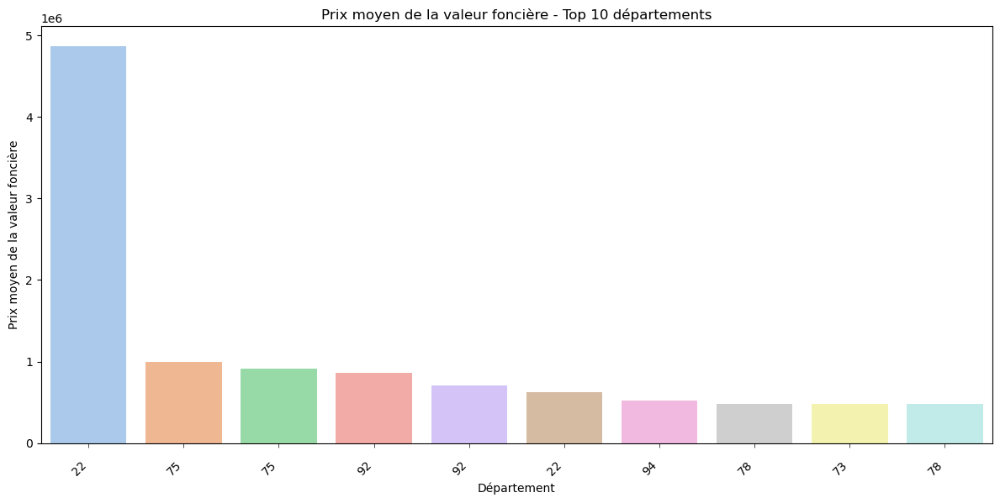

In [23]:
# Calcul du prix moyen de la valeur foncière par département
prix_moyen_par_departement = grouped.groupby('Code departement')['Valeur fonciere'].mean()

# Sélection des 10 premiers départements uniques
top_10_departements = prix_moyen_par_departement.nlargest(10)

# Création du plot avec couleurs pastel
plt.figure(figsize=(12, 6))
ax = plt.gca()
sns.barplot(x=top_10_departements.index, y=top_10_departements.values, ax=ax, palette='pastel')
plt.title('Prix moyen de la valeur foncière - Top 10 départements')
plt.xlabel('Département')
plt.ylabel('Prix moyen de la valeur foncière')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()

# Espacement des xticks
ax.xaxis.set_tick_params(width=0.5)
ax.xaxis.set_tick_params(pad=10)

plt.show()


On remarque ici que Paris est le département le plus cher, suivi des Hauts-de-Seine

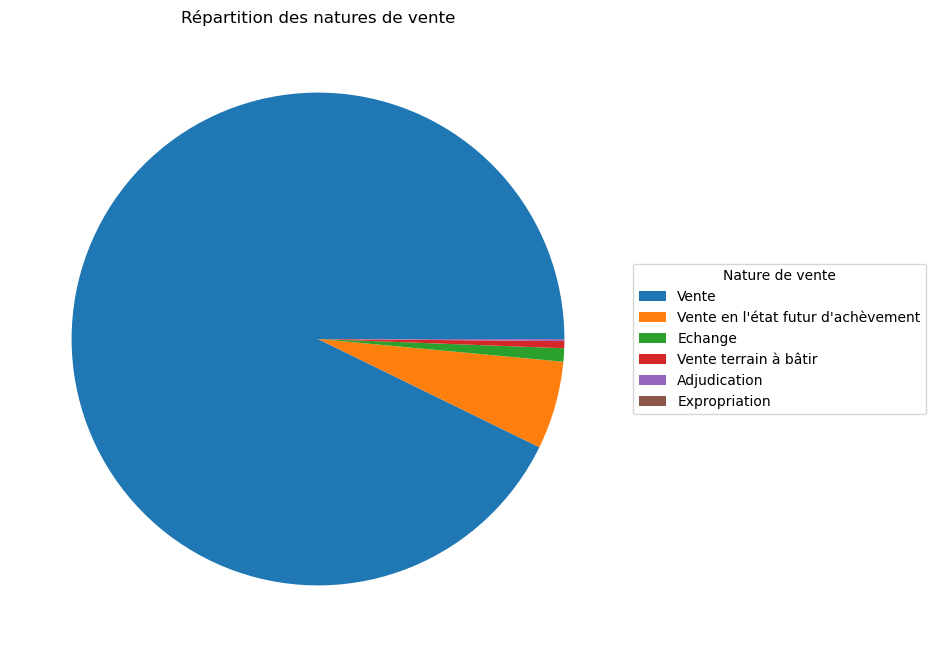

In [15]:
# Comptage des différentes natures de vente
nature_vente_counts = grouped['Nature mutation'].value_counts()

# Création du camembert sans labels ni pourcentages
plt.figure(figsize=(8, 8))
plt.pie(nature_vente_counts, labels=None, autopct=None)
plt.title('Répartition des natures de vente')

# Affichage de la légende sur le côté
plt.legend(nature_vente_counts.index, title='Nature de vente', loc='center left', bbox_to_anchor=(1, 0.5))

plt.show()

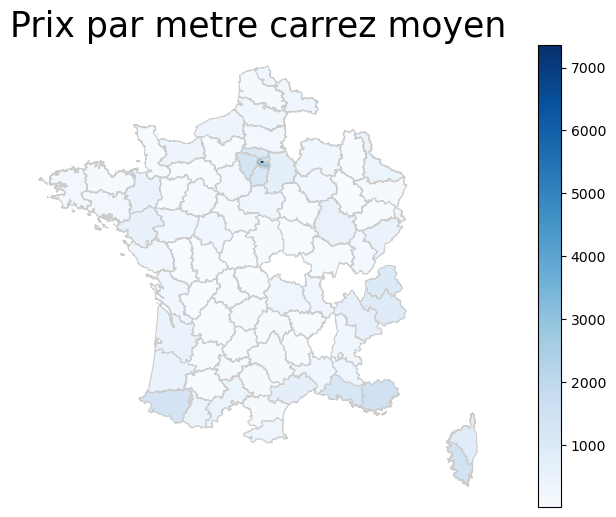

In [16]:
import geopandas as gpd
import matplotlib.pyplot as plt
import pandas as pd

france = gpd.read_file("departements-20180101.shp")
france['code_insee'] = france['code_insee'].astype(str)

france = france.loc[france['code_insee'].apply(lambda x: len(x) <= 2)]

grouped['Valeur fonciere'] = pd.to_numeric(grouped['Valeur fonciere'], errors='coerce')
grouped['Somme surfaces Carrez'] = pd.to_numeric(grouped['Somme surfaces Carrez'], errors='coerce')


grouped['Prix par metre carrez'] = grouped['Valeur fonciere'] / grouped['Somme surfaces Carrez']

grouped['Prix par metre carrez'].replace([float('inf')], 0, inplace=True)

df_avg_prix_m2 = grouped.groupby(grouped['Code departement'].astype(str))['Prix par metre carrez'].mean().reset_index()
df_avg_prix_m2.columns = ['Code departement', 'Average Prix par metre carrez']

merged = france.set_index('code_insee').join(df_avg_prix_m2.set_index('Code departement'))

variable = 'Average Prix par metre carrez'


fig, ax = plt.subplots(1, figsize=(10, 6))
ax.axis('off')
ax.set_title('Prix par metre carrez moyen', fontdict={'fontsize': '25', 'fontweight' : '3'})

merged.plot(column=variable, cmap='Blues', linewidth=0.8, ax=ax, edgecolor='0.8', legend=True)

plt.show()

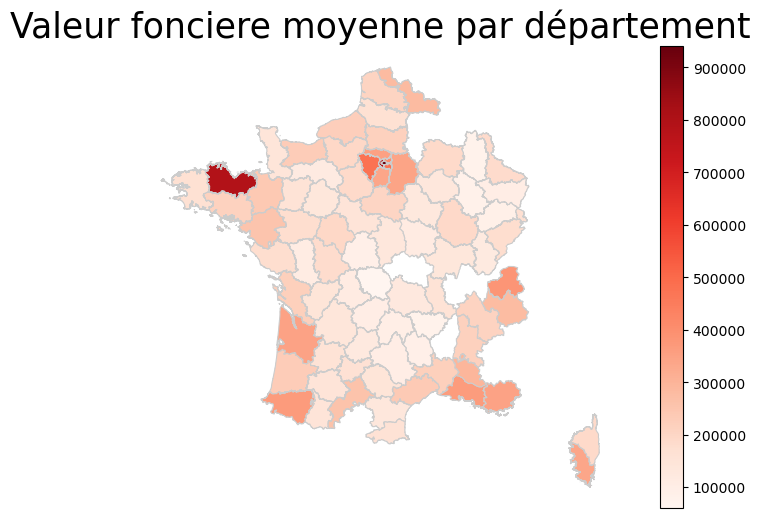

In [17]:
import geopandas as gpd
import matplotlib.pyplot as plt
import pandas as pd
import mplcursors
from mpldatacursor import datacursor

france = gpd.read_file("departements-20180101.shp")
france['code_insee'] = france['code_insee'].astype(str)

france = france.loc[france['code_insee'].apply(lambda x: len(x) <= 2)]

grouped['Valeur fonciere'] = pd.to_numeric(grouped['Valeur fonciere'], errors='coerce')

df_avg_prix = grouped.groupby(grouped['Code departement'].astype(str))['Valeur fonciere'].mean().reset_index()
df_avg_prix.columns = ['Code departement', 'Average Valeur fonciere']

merged = france.set_index('code_insee').join(df_avg_prix.set_index('Code departement'))

variable = 'Average Valeur fonciere'

fig, ax = plt.subplots(1, figsize=(10, 6))
ax.axis('off')
ax.set_title('Valeur fonciere moyenne par département', fontdict={'fontsize': '25', 'fontweight' : '3'})

merged.plot(column=variable, cmap='Reds', linewidth=0.8, ax=ax, edgecolor='0.8', legend=True)

plt.show()


# ENCODING

On encode maintenant les colonnes catégoriques 

In [17]:
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()

In [18]:
grouped['Nature mutation'] = le.fit_transform(grouped['Nature mutation'])
grouped['Section'] = le.fit_transform(grouped['Section'])
grouped['Voie'] = le.fit_transform(grouped['Voie'])
grouped['Type de voie'] = le.fit_transform(grouped['Type de voie'])
grouped['Nature culture'] = le.fit_transform(grouped['Nature culture'])

In [19]:
grouped

,Unnamed: 0,Date mutation,Valeur fonciere,Adresse,No disposition,Nature mutation,No voie,Type de voie,Code voie,Voie,...,Code commune,Section,No plan,Nombre de lots,Surface reelle bati,Nombre pieces principales,Nature culture,Surface terrain,New Type local,Somme surfaces Carrez
0,0,20/06/2022,15000.0,ACH 0001 ANCIEN CHEMIN DE BANNONCOU 55300.0 DO...,1,3,NaN,0,0001,7767,...,159,2,59,0,0.0,0.0,0,1615.0,NaN,0.0
1,1,28/07/2022,30000.0,ACH 0001 ANCIEN CHEMIN DE BANNONCOU 55300.0 DO...,1,3,NaN,0,0001,7767,...,159,2,60 61,0,0.0,0.0,0,2874.0,NaN,0.0
2,2,07/09/2022,507000.0,ACH 0001 ANCIEN CHEMIN DE GRABELS 34270.0 LES ...,1,3,93.0,0,0001,7778,...,153,16,228,0,112.0,4.0,7367,400.0,5.0,0.0
3,3,15/09/2022,170000.0,ACH 0001 ANCIEN CHEMIN ROYAL 48130.0 PEYRE EN ...,1,3,1.0,0,0001,7804,...,9,0,798,0,80.0,3.0,7367,212.0,5.0,0.0
4,4,23/03/2022,25000.0,ACH 0002 ANCIEN CHEMIN DU MOULIN 34270.0 LES M...,1,3,1124.0,0,0002,7799,...,153,14,298,0,0.0,0.0,0,226.0,NaN,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1678839,1678839,24/10/2022,166000.0,nan nan nan nan ZONZA 2A 362,1,4,NaN,134,NaN,420124,...,362,162,3645,1,0.0,0.0,10979,0.0,NaN,0.0
1678840,1678840,30/09/2022,260000.0,nan nan nan nan ZONZA 2A 362,1,4,NaN,134,NaN,420124,...,362,162,3645,1,0.0,0.0,10979,0.0,NaN,0.0
1678841,1678841,02/03/2022,745000.0,nan nan nan nan ZONZA 2A 362,1,4,NaN,134,NaN,420124,...,362,208,4332,0,0.0,0.0,10979,0.0,NaN,0.0
1678842,1678842,07/04/2022,745000.0,nan nan nan nan ZONZA 2A 362,1,4,NaN,134,NaN,420124,...,362,208,4331,0,0.0,0.0,10979,0.0,NaN,0.0


In [20]:
grouped['Date mutation'] = pd.to_datetime(grouped['Date mutation'])

date_reference = pd.to_datetime('04/04/2018')

C:\Users\fchan\AppData\Local\Temp\ipykernel_65116\1117518189.py:1: UserWarning: Parsing dates in DD/MM/YYYY format when dayfirst=False (the default) was specified. This may lead to inconsistently parsed dates! Specify a format to ensure consistent parsing.
  grouped['Date mutation'] = pd.to_datetime(grouped['Date mutation'])


In [21]:
grouped.columns

Index(['Unnamed: 0', 'Date mutation', 'Valeur fonciere', 'Adresse',
       'No disposition', 'Nature mutation', 'No voie', 'Type de voie',
       'Code voie', 'Voie', 'Code postal', 'Commune', 'Code departement',
       'Code commune', 'Section', 'No plan', 'Nombre de lots',
       'Surface reelle bati', 'Nombre pieces principales', 'Nature culture',
       'Surface terrain', 'New Type local', 'Somme surfaces Carrez'],
      dtype='object')

# CLEANING DATASET

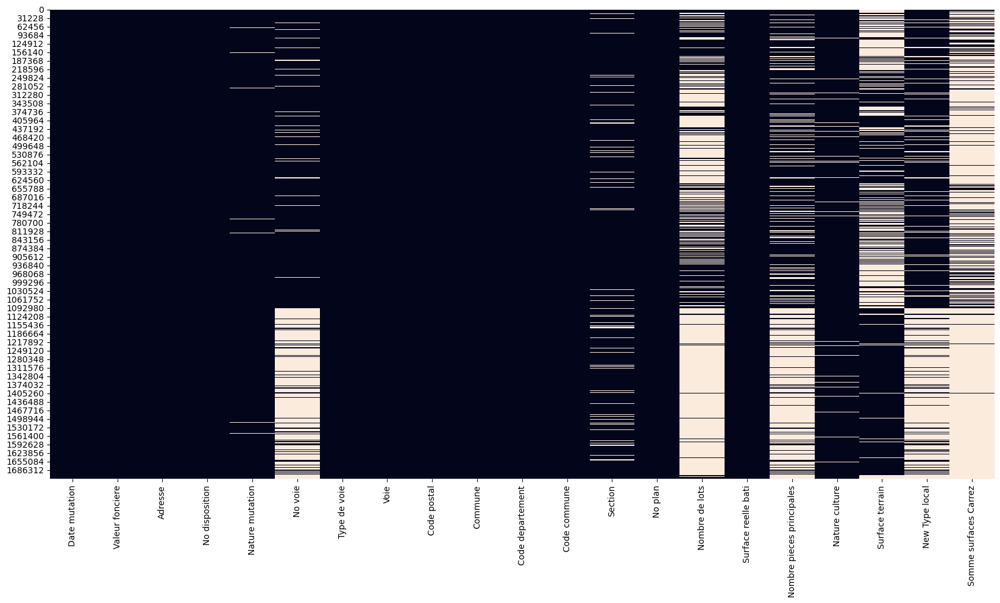

In [28]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

grouped_zeros_as_na = grouped.replace(0, np.nan)

plt.figure(figsize=(20, 10))
sns.heatmap(grouped_zeros_as_na.isna(), cbar=False)
plt.show()


In [22]:
#On cherche les lignes qui ne possèdent aucunes surfaces et sont donc non exploitables

filtered_data = grouped[(grouped["New Type local"].isna() | (grouped["New Type local"] == 0)) &
                        ((grouped["Surface reelle bati"] == 0) | (grouped["Surface reelle bati"] == 0)) &
                        ((grouped["Surface terrain"] == 0) | (grouped["Surface terrain"] == 0)) &
                        ((grouped["Somme surfaces Carrez"] == 0) | (grouped["Somme surfaces Carrez"] == 0))]
filtered_data

,Unnamed: 0,Date mutation,Valeur fonciere,Adresse,No disposition,Nature mutation,No voie,Type de voie,Code voie,Voie,...,Code commune,Section,No plan,Nombre de lots,Surface reelle bati,Nombre pieces principales,Nature culture,Surface terrain,New Type local,Somme surfaces Carrez
172,172,2022-02-08,221000.0,ALL 0001 DES ACACIAS 59840.0 PERENCHIES 59 457,1,4,NaN,2,0001,119647,...,457,8,706,2,0.0,0.0,10979,0.0,NaN,0.0
173,173,2022-12-09,231000.0,ALL 0001 DES ACACIAS 59840.0 PERENCHIES 59 457,1,4,NaN,2,0001,119647,...,457,8,706,2,0.0,0.0,10979,0.0,NaN,0.0
177,177,2022-02-09,287000.0,ALL 0001 DES ACACIAS 59840.0 PERENCHIES 59 457,1,4,NaN,2,0001,119647,...,457,8,706,2,0.0,0.0,10979,0.0,NaN,0.0
1441,1441,2022-02-25,153500.0,ALL 0019 DE LA GRANGE 35230.0 NOYAL-CHATILLON-...,1,4,NaN,2,0019,93815,...,206,15,828,2,0.0,0.0,10979,0.0,NaN,0.0
1443,1443,2022-06-16,170000.0,ALL 0019 DE LA GRANGE 35230.0 NOYAL-CHATILLON-...,1,4,NaN,2,0019,93815,...,206,15,828,2,0.0,0.0,10979,0.0,NaN,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1678839,1678839,2022-10-24,166000.0,nan nan nan nan ZONZA 2A 362,1,4,NaN,134,NaN,420124,...,362,162,3645,1,0.0,0.0,10979,0.0,NaN,0.0
1678840,1678840,2022-09-30,260000.0,nan nan nan nan ZONZA 2A 362,1,4,NaN,134,NaN,420124,...,362,162,3645,1,0.0,0.0,10979,0.0,NaN,0.0
1678841,1678841,2022-02-03,745000.0,nan nan nan nan ZONZA 2A 362,1,4,NaN,134,NaN,420124,...,362,208,4332,0,0.0,0.0,10979,0.0,NaN,0.0
1678842,1678842,2022-07-04,745000.0,nan nan nan nan ZONZA 2A 362,1,4,NaN,134,NaN,420124,...,362,208,4331,0,0.0,0.0,10979,0.0,NaN,0.0


In [23]:
grouped = grouped.drop(filtered_data.index)

In [24]:
#On regarde pour les Types de locaux qui sont nuls et possèdent une somme de surface carrez ces données ne sont pas exploitables

filtered_data2 = grouped[(grouped["New Type local"].isna() | (grouped["New Type local"] == 0)) &
                        ((grouped["Surface reelle bati"] == 0) | (grouped["Surface reelle bati"] == 0)) &
                        ((grouped["Surface terrain"] == 0) | (grouped["Surface terrain"] == 0)) &
                        ((grouped["Somme surfaces Carrez"] !=0))]
filtered_data2

,Unnamed: 0,Date mutation,Valeur fonciere,Adresse,No disposition,Nature mutation,No voie,Type de voie,Code voie,Voie,...,Code commune,Section,No plan,Nombre de lots,Surface reelle bati,Nombre pieces principales,Nature culture,Surface terrain,New Type local,Somme surfaces Carrez
2751,2751,2022-02-06,127900.0,ALL 0038 DES CHARPENTIERS 44190.0 GORGES 44 64,1,4,2.0,2,0038,123498,...,64,32,185,2,0.0,0.0,10979,0.0,NaN,40.15
2752,2752,2022-01-06,139100.0,ALL 0038 DES CHARPENTIERS 44190.0 GORGES 44 64,1,4,2.0,2,0038,123498,...,64,32,185,2,0.0,0.0,10979,0.0,NaN,44.49
2754,2754,2022-06-16,139200.0,ALL 0038 DES CHARPENTIERS 44190.0 GORGES 44 64,1,4,2.0,2,0038,123498,...,64,32,185,2,0.0,0.0,10979,0.0,NaN,43.04
2755,2755,2022-01-06,139800.0,ALL 0038 DES CHARPENTIERS 44190.0 GORGES 44 64,1,4,2.0,2,0038,123498,...,64,32,185,2,0.0,0.0,10979,0.0,NaN,43.04
2756,2756,2022-07-07,192000.0,ALL 0038 DES CHARPENTIERS 44190.0 GORGES 44 64,1,4,2.0,2,0038,123498,...,64,32,185,2,0.0,0.0,10979,0.0,NaN,62.19
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1678786,1678786,2022-11-10,142000.0,nan nan nan nan WAMBRECHIES 59 636,1,4,NaN,134,NaN,420124,...,636,27,7048,3,0.0,0.0,10979,0.0,NaN,40.92
1678787,1678787,2022-04-10,142400.0,nan nan nan nan WAMBRECHIES 59 636,1,4,NaN,134,NaN,420124,...,636,27,7048,3,0.0,0.0,10979,0.0,NaN,40.64
1678797,1678797,2022-02-12,182500.0,nan nan nan nan WAMBRECHIES 59 636,1,4,NaN,134,NaN,420124,...,636,27,7048,2,0.0,0.0,10979,0.0,NaN,40.03
1678812,1678812,2022-12-29,222000.0,nan nan nan nan WAMBRECHIES 59 636,1,4,NaN,134,NaN,420124,...,636,27,7048,3,0.0,0.0,10979,0.0,NaN,51.23


In [27]:
grouped = grouped.drop(filtered_data2.index)

In [32]:
grouped

,Date mutation,Valeur fonciere,Adresse,No disposition,Nature mutation,No voie,Type de voie,Code voie,Voie,Code postal,...,Code commune,Section,No plan,Nombre de lots,Surface reelle bati,Nombre pieces principales,Nature culture,Surface terrain,New Type local,Somme surfaces Carrez
0,2022-06-20,15000.0,ACH 0001 ANCIEN CHEMIN DE BANNONCOU 55300.0 DO...,1,3,NaN,0,0001,7767,55300.0,...,159,2,59,0,0.0,0.0,0,1615.0,NaN,0.0
1,2022-07-28,30000.0,ACH 0001 ANCIEN CHEMIN DE BANNONCOU 55300.0 DO...,1,3,NaN,0,0001,7767,55300.0,...,159,2,60 61,0,0.0,0.0,0,2874.0,NaN,0.0
2,2022-07-09,507000.0,ACH 0001 ANCIEN CHEMIN DE GRABELS 34270.0 LES ...,1,3,93.0,0,0001,7778,34270.0,...,153,16,228,0,112.0,4.0,7367,400.0,5.0,0.0
3,2022-09-15,170000.0,ACH 0001 ANCIEN CHEMIN ROYAL 48130.0 PEYRE EN ...,1,3,1.0,0,0001,7804,48130.0,...,9,0,798,0,80.0,3.0,7367,212.0,5.0,0.0
4,2022-03-23,25000.0,ACH 0002 ANCIEN CHEMIN DU MOULIN 34270.0 LES M...,1,3,1124.0,0,0002,7799,34270.0,...,153,14,298,0,0.0,0.0,0,226.0,NaN,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1662752,2022-09-15,1696950.0,nan X458 ESPLANADE FREDERIC DUMAS 83110.0 SANA...,1,3,69.0,134,X458,175066,83110.0,...,123,23,413,0,80.0,5.0,7367,303.0,5.0,0.0
1662753,2022-11-30,113100.0,nan X549 RDN 8 83330.0 LE BEAUSSET 83 16,1,3,9002.0,134,X549,385979,83330.0,...,16,2,425,3,94.0,3.0,10979,0.0,6.0,0.0
1662754,2022-09-13,420000.0,nan X549 RDN 8 83330.0 LE BEAUSSET 83 16,2,3,1965.0,134,X549,385979,83330.0,...,16,0,2562,0,184.0,5.0,10979,0.0,1.0,0.0
1662755,2022-10-25,900000.0,nan X549 RDN 8 83330.0 LE BEAUSSET 83 16,1,3,545.0,134,X549,385979,83330.0,...,16,3,545,0,745.0,3.0,7367,2249.0,7.0,0.0


In [33]:
#On peut maintenant fill tous les NaN de Type local par 0 qui correspondra à une vente de Terrain et non de local

grouped["New Type local"] = grouped["New Type local"].fillna(0)

In [34]:
#Excepté No voie toutes les valeurs sont désormais non nulles

grouped.isnull().sum()

Date mutation                     0
Valeur fonciere                   0
Adresse                           0
No disposition                    0
Nature mutation                   0
No voie                      531316
Type de voie                      0
Code voie                         0
Voie                              0
Code postal                       0
Commune                           0
Code departement                  0
Code commune                      0
Section                           0
No plan                           0
Nombre de lots                    0
Surface reelle bati               0
Nombre pieces principales         0
Nature culture                    0
Surface terrain                   0
New Type local                    0
Somme surfaces Carrez             0
dtype: int64

In [35]:
grouped = grouped.drop('No voie', axis=1)

In [36]:
colonnes = ['Surface reelle bati', 'Surface terrain', 'Somme surfaces Carrez']

In [37]:
#On regarde ceux qui possèdent des Surfaces nulles et sont donc inexploitables également
mask = (grouped[colonnes] == 0).all(axis=1)
result = grouped[mask]

In [38]:
grouped = grouped.drop(result.index)

In [39]:
grouped

,Date mutation,Valeur fonciere,Adresse,No disposition,Nature mutation,Type de voie,Code voie,Voie,Code postal,Commune,...,Code commune,Section,No plan,Nombre de lots,Surface reelle bati,Nombre pieces principales,Nature culture,Surface terrain,New Type local,Somme surfaces Carrez
0,2022-06-20,15000.0,ACH 0001 ANCIEN CHEMIN DE BANNONCOU 55300.0 DO...,1,3,0,0001,7767,55300.0,DOMPCEVRIN,...,159,2,59,0,0.0,0.0,0,1615.0,0,0.0
1,2022-07-28,30000.0,ACH 0001 ANCIEN CHEMIN DE BANNONCOU 55300.0 DO...,1,3,0,0001,7767,55300.0,DOMPCEVRIN,...,159,2,60 61,0,0.0,0.0,0,2874.0,0,0.0
2,2022-07-09,507000.0,ACH 0001 ANCIEN CHEMIN DE GRABELS 34270.0 LES ...,1,3,0,0001,7778,34270.0,LES MATELLES,...,153,16,228,0,112.0,4.0,7367,400.0,5.0,0.0
3,2022-09-15,170000.0,ACH 0001 ANCIEN CHEMIN ROYAL 48130.0 PEYRE EN ...,1,3,0,0001,7804,48130.0,PEYRE EN AUBRAC,...,9,0,798,0,80.0,3.0,7367,212.0,5.0,0.0
4,2022-03-23,25000.0,ACH 0002 ANCIEN CHEMIN DU MOULIN 34270.0 LES M...,1,3,0,0002,7799,34270.0,LES MATELLES,...,153,14,298,0,0.0,0.0,0,226.0,0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1662752,2022-09-15,1696950.0,nan X458 ESPLANADE FREDERIC DUMAS 83110.0 SANA...,1,3,134,X458,175066,83110.0,SANARY SUR MER,...,123,23,413,0,80.0,5.0,7367,303.0,5.0,0.0
1662753,2022-11-30,113100.0,nan X549 RDN 8 83330.0 LE BEAUSSET 83 16,1,3,134,X549,385979,83330.0,LE BEAUSSET,...,16,2,425,3,94.0,3.0,10979,0.0,6.0,0.0
1662754,2022-09-13,420000.0,nan X549 RDN 8 83330.0 LE BEAUSSET 83 16,2,3,134,X549,385979,83330.0,LE BEAUSSET,...,16,0,2562,0,184.0,5.0,10979,0.0,1.0,0.0
1662755,2022-10-25,900000.0,nan X549 RDN 8 83330.0 LE BEAUSSET 83 16,1,3,134,X549,385979,83330.0,LE BEAUSSET,...,16,3,545,0,745.0,3.0,7367,2249.0,7.0,0.0


In [40]:
#Une dépendance est généralement considéré comme un bâtiment ou une structure construite

dep = grouped[(grouped["New Type local"] == 3.0) & (grouped["Surface reelle bati"] == 0)]

In [41]:
grouped = grouped.drop(dep.index)

In [42]:
grouped

,Date mutation,Valeur fonciere,Adresse,No disposition,Nature mutation,Type de voie,Code voie,Voie,Code postal,Commune,...,Code commune,Section,No plan,Nombre de lots,Surface reelle bati,Nombre pieces principales,Nature culture,Surface terrain,New Type local,Somme surfaces Carrez
0,2022-06-20,15000.0,ACH 0001 ANCIEN CHEMIN DE BANNONCOU 55300.0 DO...,1,3,0,0001,7767,55300.0,DOMPCEVRIN,...,159,2,59,0,0.0,0.0,0,1615.0,0,0.0
1,2022-07-28,30000.0,ACH 0001 ANCIEN CHEMIN DE BANNONCOU 55300.0 DO...,1,3,0,0001,7767,55300.0,DOMPCEVRIN,...,159,2,60 61,0,0.0,0.0,0,2874.0,0,0.0
2,2022-07-09,507000.0,ACH 0001 ANCIEN CHEMIN DE GRABELS 34270.0 LES ...,1,3,0,0001,7778,34270.0,LES MATELLES,...,153,16,228,0,112.0,4.0,7367,400.0,5.0,0.0
3,2022-09-15,170000.0,ACH 0001 ANCIEN CHEMIN ROYAL 48130.0 PEYRE EN ...,1,3,0,0001,7804,48130.0,PEYRE EN AUBRAC,...,9,0,798,0,80.0,3.0,7367,212.0,5.0,0.0
4,2022-03-23,25000.0,ACH 0002 ANCIEN CHEMIN DU MOULIN 34270.0 LES M...,1,3,0,0002,7799,34270.0,LES MATELLES,...,153,14,298,0,0.0,0.0,0,226.0,0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1662752,2022-09-15,1696950.0,nan X458 ESPLANADE FREDERIC DUMAS 83110.0 SANA...,1,3,134,X458,175066,83110.0,SANARY SUR MER,...,123,23,413,0,80.0,5.0,7367,303.0,5.0,0.0
1662753,2022-11-30,113100.0,nan X549 RDN 8 83330.0 LE BEAUSSET 83 16,1,3,134,X549,385979,83330.0,LE BEAUSSET,...,16,2,425,3,94.0,3.0,10979,0.0,6.0,0.0
1662754,2022-09-13,420000.0,nan X549 RDN 8 83330.0 LE BEAUSSET 83 16,2,3,134,X549,385979,83330.0,LE BEAUSSET,...,16,0,2562,0,184.0,5.0,10979,0.0,1.0,0.0
1662755,2022-10-25,900000.0,nan X549 RDN 8 83330.0 LE BEAUSSET 83 16,1,3,134,X549,385979,83330.0,LE BEAUSSET,...,16,3,545,0,745.0,3.0,7367,2249.0,7.0,0.0


# Handling Code departement

In [43]:
import pandas as pd

code_departement_numeric = pd.to_numeric(grouped["Code departement"], errors='coerce')

non_integer_rows = grouped[pd.isna(code_departement_numeric)]

non_integer_rows["Code departement"].value_counts()

2A    3373
2B    2752
Name: Code departement, dtype: int64

In [44]:
#Changer les données de la Corse

corse_mapping = {"2A": 120, "2B": 121}

grouped["Code departement"] = grouped["Code departement"].replace(corse_mapping)

grouped["Code departement"] = grouped["Code departement"].astype(int)

grouped["Code departement"].value_counts()

59     53208
33     45597
44     43006
75     41453
6      37552
       ...  
121     2752
4       2597
972     2143
973     1807
971     1657
Name: Code departement, Length: 97, dtype: int64

In [45]:
grouped['Code departement'] = le.fit_transform(grouped['Code departement'])

In [46]:
grouped["Code postal"] = grouped["Code postal"].astype(int)

In [47]:
grouped

,Date mutation,Valeur fonciere,Adresse,No disposition,Nature mutation,Type de voie,Code voie,Voie,Code postal,Commune,...,Code commune,Section,No plan,Nombre de lots,Surface reelle bati,Nombre pieces principales,Nature culture,Surface terrain,New Type local,Somme surfaces Carrez
0,2022-06-20,15000.0,ACH 0001 ANCIEN CHEMIN DE BANNONCOU 55300.0 DO...,1,3,0,0001,7767,55300,DOMPCEVRIN,...,159,2,59,0,0.0,0.0,0,1615.0,0,0.0
1,2022-07-28,30000.0,ACH 0001 ANCIEN CHEMIN DE BANNONCOU 55300.0 DO...,1,3,0,0001,7767,55300,DOMPCEVRIN,...,159,2,60 61,0,0.0,0.0,0,2874.0,0,0.0
2,2022-07-09,507000.0,ACH 0001 ANCIEN CHEMIN DE GRABELS 34270.0 LES ...,1,3,0,0001,7778,34270,LES MATELLES,...,153,16,228,0,112.0,4.0,7367,400.0,5.0,0.0
3,2022-09-15,170000.0,ACH 0001 ANCIEN CHEMIN ROYAL 48130.0 PEYRE EN ...,1,3,0,0001,7804,48130,PEYRE EN AUBRAC,...,9,0,798,0,80.0,3.0,7367,212.0,5.0,0.0
4,2022-03-23,25000.0,ACH 0002 ANCIEN CHEMIN DU MOULIN 34270.0 LES M...,1,3,0,0002,7799,34270,LES MATELLES,...,153,14,298,0,0.0,0.0,0,226.0,0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1662752,2022-09-15,1696950.0,nan X458 ESPLANADE FREDERIC DUMAS 83110.0 SANA...,1,3,134,X458,175066,83110,SANARY SUR MER,...,123,23,413,0,80.0,5.0,7367,303.0,5.0,0.0
1662753,2022-11-30,113100.0,nan X549 RDN 8 83330.0 LE BEAUSSET 83 16,1,3,134,X549,385979,83330,LE BEAUSSET,...,16,2,425,3,94.0,3.0,10979,0.0,6.0,0.0
1662754,2022-09-13,420000.0,nan X549 RDN 8 83330.0 LE BEAUSSET 83 16,2,3,134,X549,385979,83330,LE BEAUSSET,...,16,0,2562,0,184.0,5.0,10979,0.0,1.0,0.0
1662755,2022-10-25,900000.0,nan X549 RDN 8 83330.0 LE BEAUSSET 83 16,1,3,134,X549,385979,83330,LE BEAUSSET,...,16,3,545,0,745.0,3.0,7367,2249.0,7.0,0.0


In [48]:
grouped = grouped.drop("Adresse", axis = 1)

In [49]:
grouped = grouped.drop(["No plan", "Commune"], axis = 1)

In [50]:
grouped = grouped.drop("Code voie", axis = 1)

In [51]:
grouped.columns

Index(['Date mutation', 'Valeur fonciere', 'No disposition', 'Nature mutation',
       'Type de voie', 'Voie', 'Code postal', 'Code departement',
       'Code commune', 'Section', 'Nombre de lots', 'Surface reelle bati',
       'Nombre pieces principales', 'Nature culture', 'Surface terrain',
       'New Type local', 'Somme surfaces Carrez'],
      dtype='object')

# DISPERSION PLOT

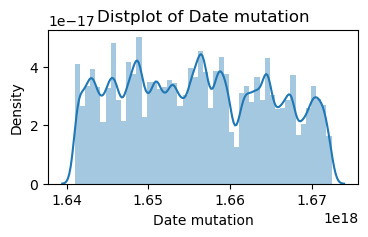

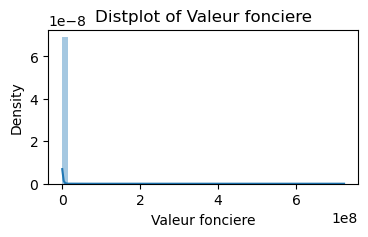

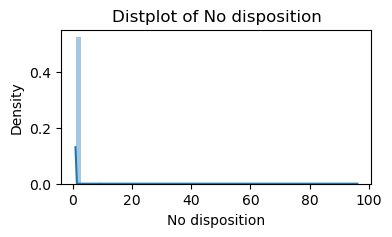

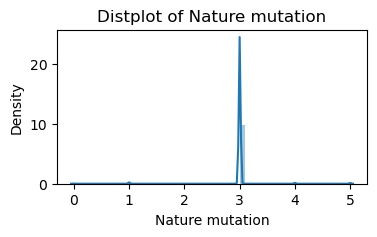

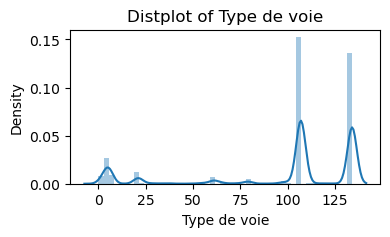

...

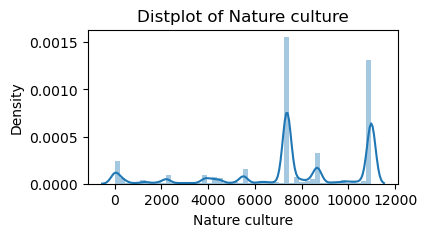

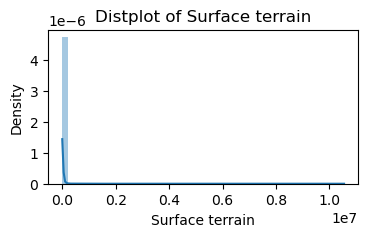

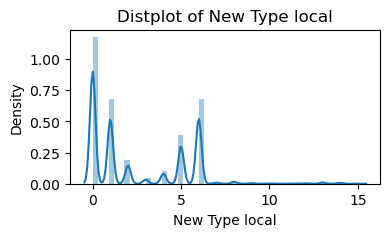

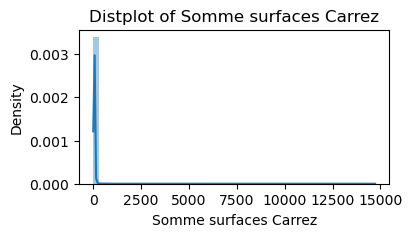

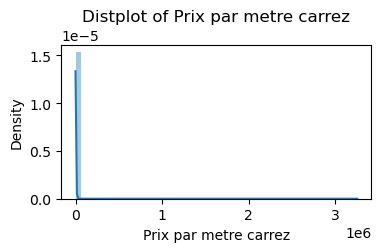

In [52]:
import warnings
import seaborn as sns
import matplotlib.pyplot as plt

warnings.filterwarnings("ignore", category=UserWarning)

for col in grouped:
    plt.figure(figsize=(4, 2))
    sns.distplot(grouped[col])
    plt.title(f'Distplot of {col}')
    plt.show()


In [52]:
grouped["New Type local"] = grouped["New Type local"].astype(float)

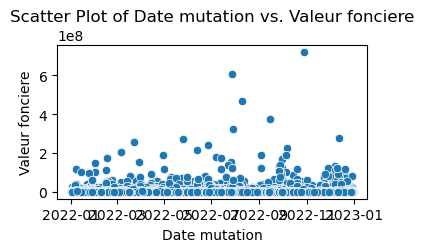

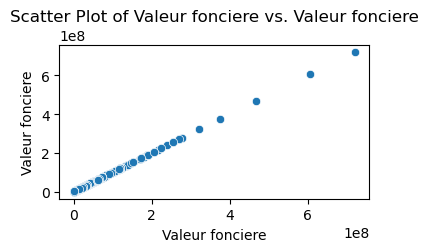

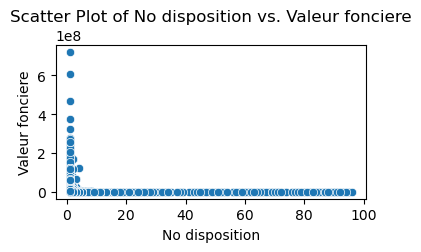

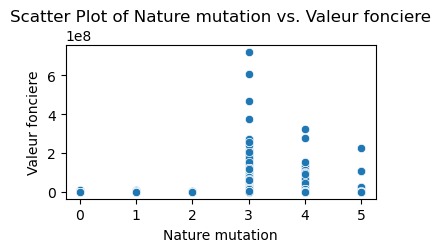

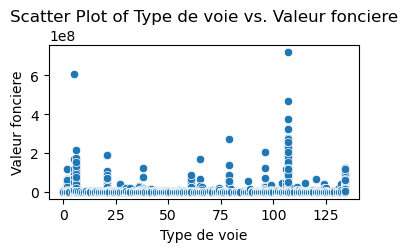

...

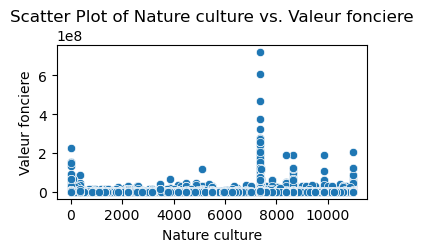

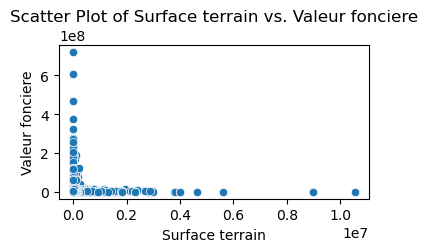

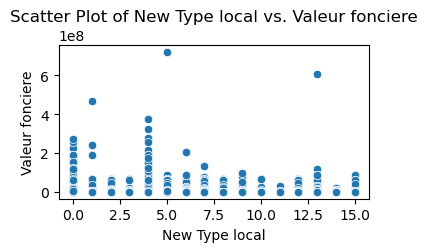

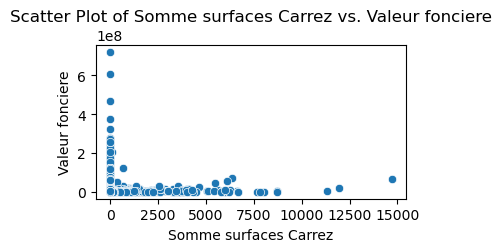

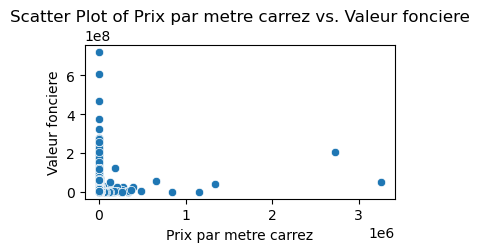

In [54]:
import warnings

warnings.filterwarnings("ignore", category=UserWarning)

for col in grouped:
    plt.figure(figsize=(4, 2))
    sns.scatterplot(data=grouped, x=col, y='Valeur fonciere')
    plt.title(f'Scatter Plot of {col} vs. Valeur fonciere')
    plt.show()


On peut remarquer de nombreuses valeurs aberrantes 

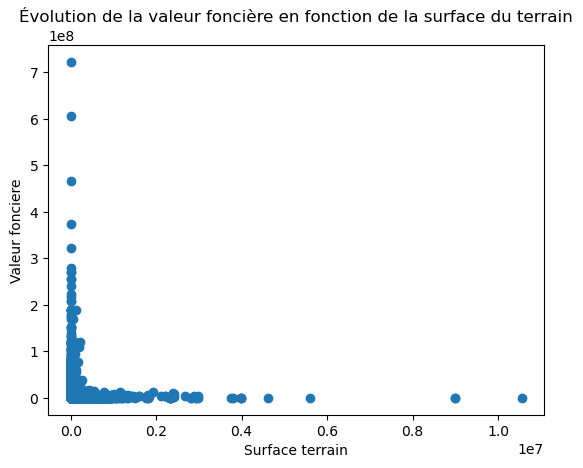

In [55]:
import warnings
import seaborn as sns
import matplotlib.pyplot as plt

warnings.filterwarnings("ignore", category=UserWarning)

# Création du diagramme de dispersion
plt.scatter(grouped["Surface terrain"], grouped["Valeur fonciere"])
plt.xlabel("Surface terrain")
plt.ylabel("Valeur fonciere")
plt.title("Évolution de la valeur foncière en fonction de la surface du terrain")
plt.show()


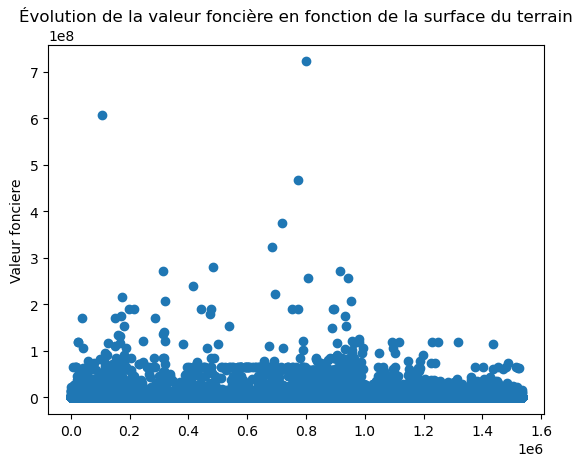

In [57]:
import warnings
import seaborn as sns
import matplotlib.pyplot as plt

warnings.filterwarnings("ignore", category=UserWarning)

# Création du diagramme de dispersion
plt.scatter(range(len(grouped["Valeur fonciere"])), grouped["Valeur fonciere"])
plt.ylabel("Valeur fonciere")
plt.title("Évolution de la valeur foncière en fonction de la surface du terrain")
plt.show()


In [53]:
#On retire les valeurs aberrantes de valeurs fonciere 

grouped = grouped[~(grouped["Valeur fonciere"] <= 1000)]
grouped = grouped[~(grouped["Valeur fonciere"] >= 1*10**6)]

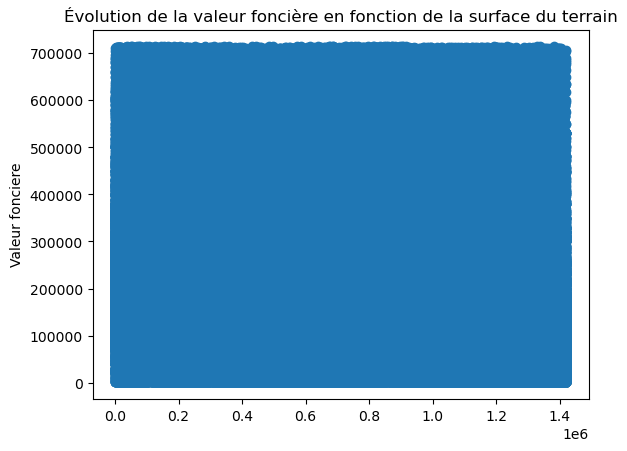

In [73]:
import warnings
import seaborn as sns
import matplotlib.pyplot as plt

warnings.filterwarnings("ignore", category=UserWarning)

# Création du diagramme de dispersion

plt.scatter(range(len(grouped["Valeur fonciere"])), grouped["Valeur fonciere"])
plt.ylabel("Valeur fonciere")
plt.title("Évolution de la valeur foncière en fonction de la surface du terrain")
plt.show()


# Removing Outliers

In [54]:
#On enlève les outliers pour Valeur fonciere 
from scipy import stats
import numpy as np
z_scores = stats.zscore(grouped['Valeur fonciere'])
threshold = 3
outlier_indices = np.where(np.abs(z_scores) > threshold)[0]
grouped = grouped.drop(grouped.index[outlier_indices], errors='ignore')

In [55]:
#On retire les valeurs aberrantes des surfaces

z_scores_carrez = np.abs(stats.zscore(grouped["Somme surfaces Carrez"]))
z_scores_terrain = np.abs(stats.zscore(grouped["Surface terrain"]))
z_scores_bati = np.abs(stats.zscore(grouped["Surface reelle bati"]))

threshold = 3

mask = (z_scores_carrez > threshold) | (z_scores_terrain > threshold) | (z_scores_bati > threshold)

# Supprimer les lignes avec des valeurs aberrantes
filtered = grouped.drop(grouped[mask].index)

In [56]:
#On retire les valeurs aberrantes des surfaces

z_scores_pieces = np.abs(stats.zscore(filtered["Nombre pieces principales"]))

threshold = 3

mask = (z_scores_pieces > threshold)

# Supprimer les lignes avec des valeurs aberrantes
filtered = filtered.drop(filtered[mask].index)

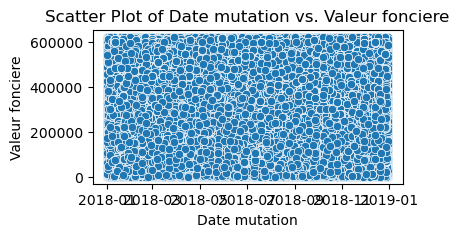

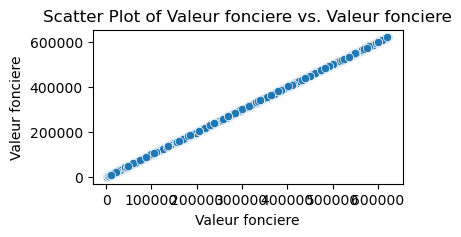

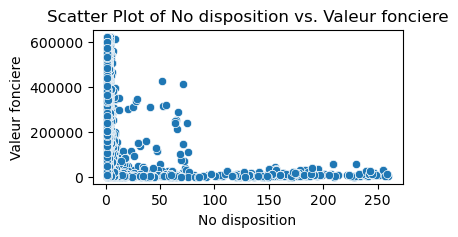

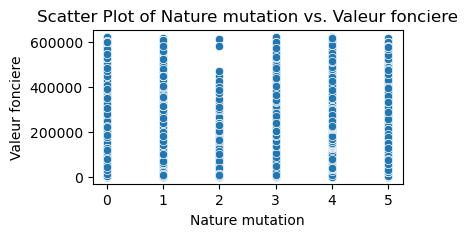

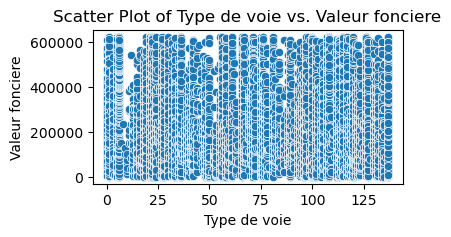

...

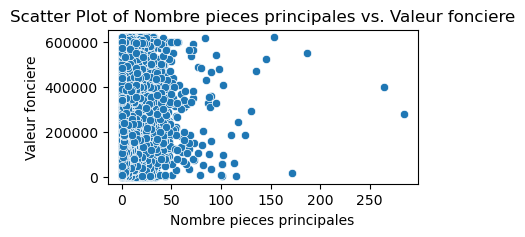

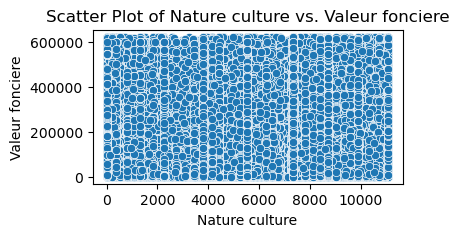

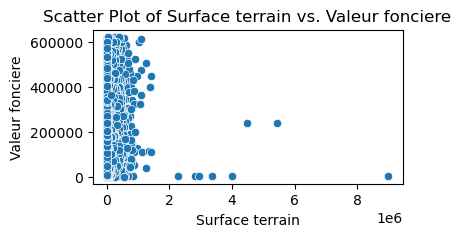

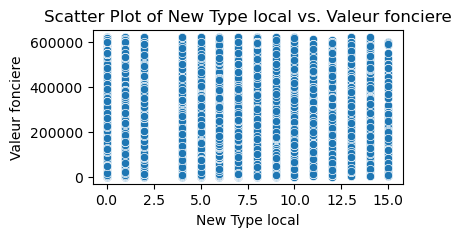

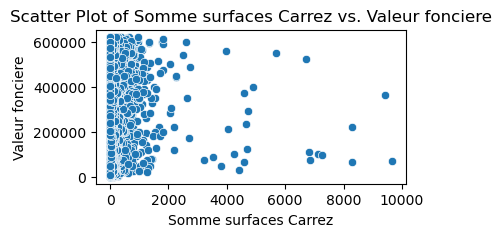

In [104]:
import warnings
import seaborn as sns
import matplotlib.pyplot as plt

warnings.filterwarnings("ignore", category=UserWarning)

for col in filtered:
    plt.figure(figsize=(4, 2))
    sns.scatterplot(data=new_grouped, x=col, y='Valeur fonciere')
    plt.title(f'Scatter Plot of {col} vs. Valeur fonciere')
    plt.show()

# Normalization and Standardisation

In [57]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler
#On normalise et Standardise les colonnes de surfaces

columns_to_transform = ['Surface reelle bati', 'Nombre pieces principales', 'Surface terrain', 'Somme surfaces Carrez']

df_norm = filtered.copy()

scaler = StandardScaler()
df_norm[columns_to_transform] = scaler.fit_transform(df_norm[columns_to_transform])

min_max_scaler = MinMaxScaler()
df_norm[columns_to_transform] = min_max_scaler.fit_transform(df_norm[columns_to_transform])


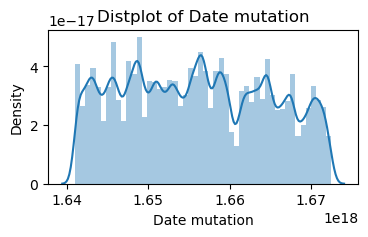

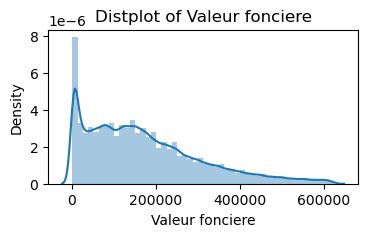

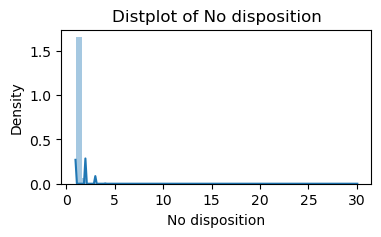

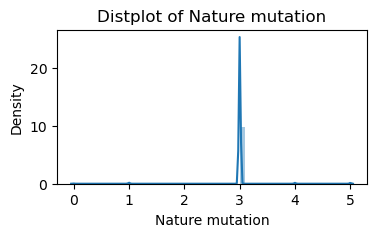

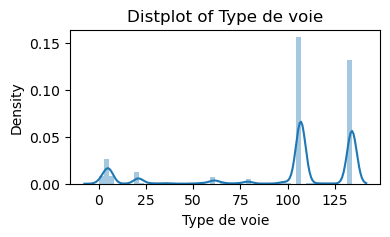

...

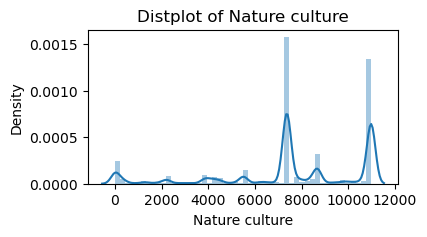

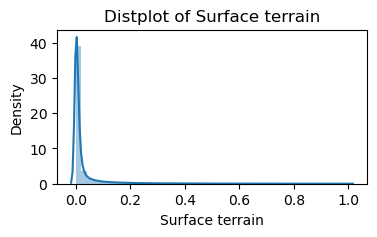

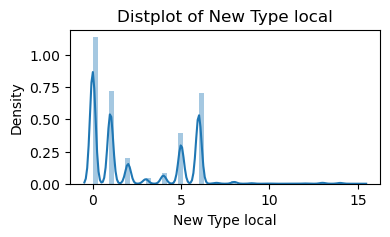

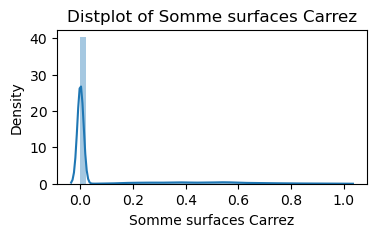

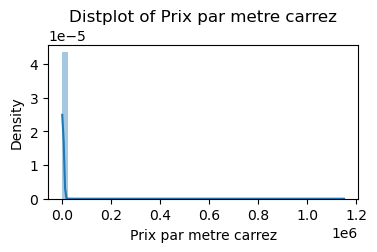

In [81]:
import warnings
import seaborn as sns
import matplotlib.pyplot as plt

warnings.filterwarnings("ignore", category=UserWarning)

for col in df_norm:
    plt.figure(figsize=(4, 2))
    sns.distplot(df_norm[col])
    plt.title(f'Distplot of {col}')
    plt.show()


In [386]:
cols = ["Surface reelle bati","Nombre pieces principales","Nature culture","Surface terrain",	"New Type local","	Somme surfaces Carrez"]

,Date mutation,Valeur fonciere,Nature mutation,Code postal,Code departement,Code commune,Nombre de lots,Surface reelle bati,Nombre pieces principales,Nature culture,Surface terrain,Somme surfaces Carrez
0,2018-04-04,330000.0,3,34270,32,153,0,140.0,4.0,7346,607.0,0.00
1,2018-10-23,70000.0,3,34270,32,102,0,0.0,0.0,7346,155.0,0.00
2,2018-04-01,785580.0,3,83330,78,16,0,312.0,12.0,1700,2640.0,0.00
6,2018-12-28,334860.0,3,34270,32,153,0,107.0,4.0,7346,342.0,0.00
7,2018-04-24,387000.0,3,66740,63,175,0,340.0,8.0,359,1273.0,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...
1704058,2018-04-19,161000.0,3,64500,61,189,1,30.0,2.0,11093,0.0,31.61
1704059,2018-07-12,181590.0,3,64500,61,189,1,29.0,2.0,11093,0.0,28.53
1704060,2018-12-14,185000.0,3,64500,61,189,1,26.0,2.0,11093,0.0,0.00
1704061,2018-06-22,205000.0,3,64500,61,189,1,40.0,2.0,11093,0.0,40.21


In [ ]:
#1.0 : Maison / 2.0 : Appartement/ 3.0 : Dépendance #6 : Appartement et dépendance

In [58]:
df_norm[(df_norm["Nombre de lots"] != 0) & (df_norm["Surface terrain"] == 0)]

,Date mutation,Valeur fonciere,No disposition,Nature mutation,Type de voie,Voie,Code postal,Code departement,Code commune,Section,Nombre de lots,Surface reelle bati,Nombre pieces principales,Nature culture,Surface terrain,New Type local,Somme surfaces Carrez
28,2022-12-08,95000.0,1,3,0,7741,84250,79,132,26,4,0.034188,0.250,10979,0.0,6.0,0.328451
58,2022-07-25,135860.0,1,3,0,7743,30700,28,295,18,3,0.032479,0.250,10979,0.0,6.0,0.411950
59,2022-11-02,137000.0,1,3,0,7743,30700,28,295,18,2,0.042735,0.250,10979,0.0,6.0,0.420391
60,2022-11-22,160000.0,1,3,0,7743,30700,28,295,18,3,0.043590,0.250,10979,0.0,6.0,0.425687
61,2022-11-29,195000.0,1,3,0,7743,30700,28,295,18,2,0.053846,0.375,10979,0.0,6.0,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1662728,2022-12-12,157500.0,1,3,134,216031,64500,61,189,3,1,0.038462,0.000,10979,0.0,4.0,0.000000
1662729,2022-09-30,250000.0,1,3,134,216031,64500,61,189,3,1,0.039316,0.250,10979,0.0,2.0,0.384475
1662730,2022-10-20,298500.0,1,3,134,216031,64500,61,189,3,2,0.041026,0.250,10979,0.0,6.0,0.000000
1662731,2022-08-29,330000.0,1,3,134,216031,64500,61,189,4,2,0.037607,0.250,10979,0.0,6.0,0.360394


# Correlation

In [62]:
import matplotlib.pyplot as plt
import seaborn as sns

C:\Users\fchan\AppData\Local\Temp\ipykernel_65116\2333056995.py:3: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  heatmap = sns.heatmap(df_norm.corr(), vmin=-1, vmax=1, annot=True)


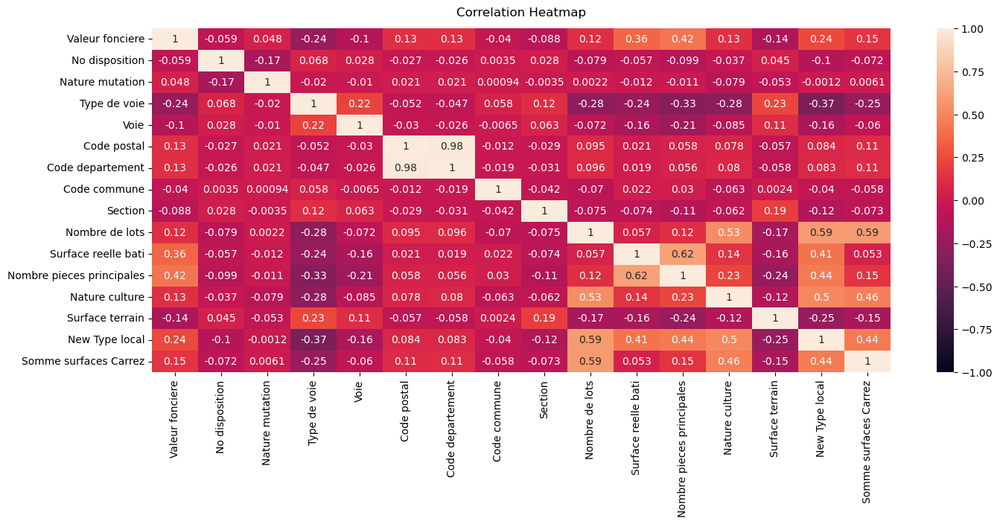

In [63]:
plt.figure(figsize=(16, 6))

heatmap = sns.heatmap(df_norm.corr(), vmin=-1, vmax=1, annot=True)
heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':12}, pad=12);

In [64]:
#On drop une des colonnes qui possède de très fortes corrélation 

df_norm = df_norm.drop("Code postal", axis = 1)

C:\Users\fchan\AppData\Local\Temp\ipykernel_65116\491284368.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation = df_norm.corr()['Valeur fonciere']


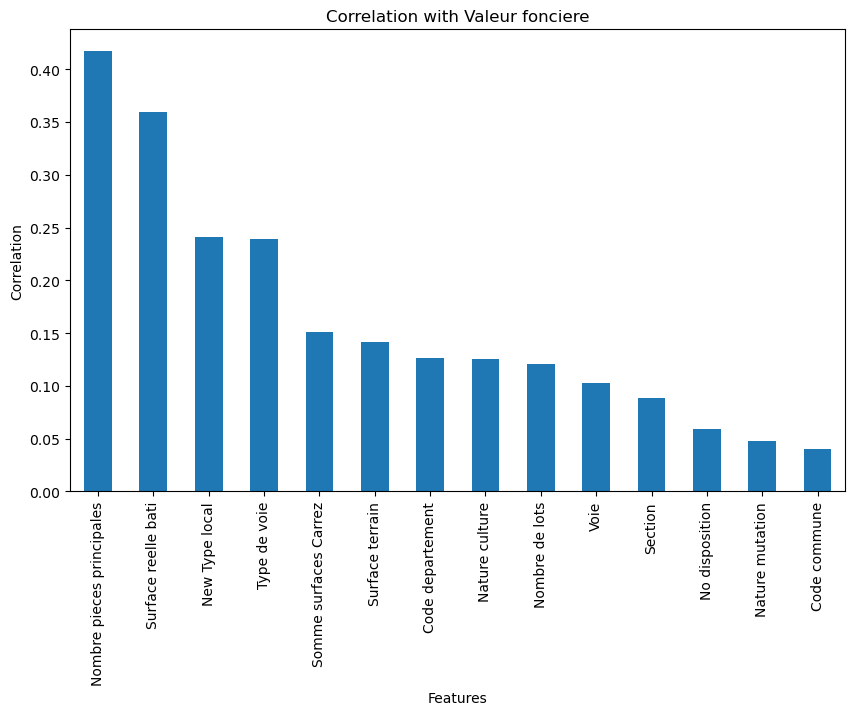

In [65]:
correlation = df_norm.corr()['Valeur fonciere']
correlation = correlation[correlation.index != 'Valeur fonciere'].abs().sort_values(ascending = False)


# Filter the columns with a correlation below 0.1
low_corr_cols = [col for col, corr in correlation.items() if corr < 0.12]

plt.figure(figsize=(10, 6))  
correlation.plot(kind='bar')
plt.title('Correlation with Valeur fonciere')
plt.xlabel('Features')
plt.ylabel('Correlation')
plt.show()

In [66]:
low_corr_cols

['Voie', 'Section', 'No disposition', 'Nature mutation', 'Code commune']

In [67]:
df_norm = df_norm.drop(low_corr_cols, axis = 1)

# PAR DEPARTEMENT

In [88]:
DEPARTMENTS = {
    1: 'Ain', 
    2: 'Aisne', 
    3: 'Allier', 
    4: 'Alpes-de-Haute-Provence', 
    5: 'Hautes-Alpes',
    6: 'Alpes-Maritimes', 
    7: 'Ardèche', 
    8: 'Ardennes', 
    9: 'Ariège', 
    10: 'Aube', 
    11: 'Aude',
    12: 'Aveyron', 
    13: 'Bouches-du-Rhône', 
    14: 'Calvados', 
    15: 'Cantal', 
    16: 'Charente',
    17: 'Charente-Maritime', 
    18: 'Cher', 
    19: 'Corrèze', 
    100 : 'Corse',
    21: 'Côte-d\'Or', 
    22: 'Côtes-d\'Armor', 
    23: 'Creuse', 
    24: 'Dordogne', 
    25: 'Doubs', 
    26: 'Drôme',
    27: 'Eure', 
    28: 'Eure-et-Loir', 
    29: 'Finistère', 
    30: 'Gard', 
    31: 'Haute-Garonne', 
    32: 'Gers',
    33: 'Gironde', 
    34: 'Hérault', 
    35: 'Ille-et-Vilaine', 
    36: 'Indre', 
    37: 'Indre-et-Loire',
    38: 'Isère', 
    39: 'Jura', 
    40: 'Landes', 
    41: 'Loir-et-Cher', 
    42: 'Loire', 
    43: 'Haute-Loire',
    44: 'Loire-Atlantique', 
    45: 'Loiret', 
    46: 'Lot', 
    47: 'Lot-et-Garonne', 
    48: 'Lozère',
    49: 'Maine-et-Loire', 
    50: 'Manche', 
    51: 'Marne', 
    52: 'Haute-Marne', 
    53: 'Mayenne',
    54: 'Meurthe-et-Moselle', 
    55: 'Meuse', 
    56: 'Morbihan', 
    57: 'Moselle', 
    58: 'Nièvre', 
    59: 'Nord',
    60: 'Oise', 
    61: 'Orne', 
    62: 'Pas-de-Calais', 
    63: 'Puy-de-Dôme', 
    64: 'Pyrénées-Atlantiques',
    65: 'Hautes-Pyrénées', 
    66: 'Pyrénées-Orientales', 
    67: 'Bas-Rhin', 
    68: 'Haut-Rhin', 
    69: 'Rhône',
    70: 'Haute-Saône', 
    71: 'Saône-et-Loire', 
    72: 'Sarthe', 
    73: 'Savoie', 
    74: 'Haute-Savoie',
    75: 'Paris', 
    76: 'Seine-Maritime', 
    77: 'Seine-et-Marne', 
    78: 'Yvelines', 
    79: 'Deux-Sèvres',
    80: 'Somme', 
    81: 'Tarn', 
    82: 'Tarn-et-Garonne', 
    83: 'Var', 
    84: 'Vaucluse', 
    85: 'Vendée',
    86: 'Vienne', 
    87: 'Haute-Vienne', 
    88: 'Vosges', 
    89: 'Yonne', 
    90: 'Territoire de Belfort',
    91: 'Essonne', 
    92: 'Hauts-de-Seine', 
    93: 'Seine-Saint-Denis', 
    94: 'Val-de-Marne', 
    95: 'Val-d\'Oise',
    971: 'Guadeloupe', 
    972: 'Martinique', 
    973: 'Guyane', 
    974: 'La Réunion', 
    976: 'Mayotte',
}

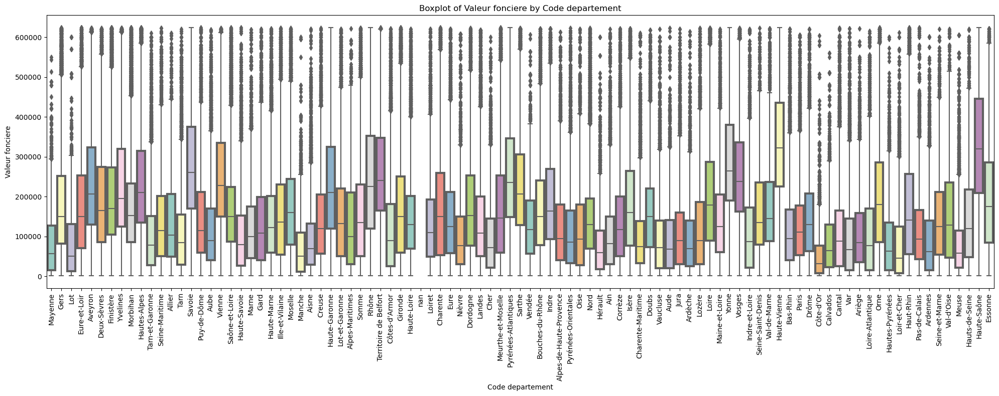

In [89]:
df_copy = df_norm.copy()
df_copy['Departement'] = df_copy['Code departement'].map(DEPARTMENTS)

data = pd.concat([df_copy['Valeur fonciere'], df_copy['Departement']], axis=1)

departement_order = df_copy['Departement'].unique()

plt.figure(figsize=(20, 8)) 

sns.boxplot(x='Departement', y='Valeur fonciere', data=data, order=departement_order, palette='Set3', boxprops=dict(linewidth=3))

plt.title("Boxplot of Valeur fonciere by Code departement")
plt.xlabel("Code departement")
plt.ylabel("Valeur fonciere")
plt.xticks(rotation=90) 

#Set the x-axis tick labels to the unique departements
plt.gca().set_xticklabels(departement_order)

plt.tight_layout()
plt.show()

In [68]:
df_norm.to_csv('df_norm2.csv', index=False)

In [90]:
import pandas as pd
df_norm = pd.read_csv("df_norm2.csv")

# DEFINIR FILTER

In [91]:
df_norm

,Date mutation,Valeur fonciere,Type de voie,Code departement,Nombre de lots,Surface reelle bati,Nombre pieces principales,Nature culture,Surface terrain,New Type local,Somme surfaces Carrez
0,2022-06-20,15000.0,0,53,0,0.000000,0.000,0,0.021611,0.0,0.000000
1,2022-07-28,30000.0,0,53,0,0.000000,0.000,0,0.038458,0.0,0.000000
2,2022-07-09,507000.0,0,32,0,0.095726,0.500,7367,0.005353,5.0,0.000000
3,2022-09-15,170000.0,0,46,0,0.068376,0.375,7367,0.002837,5.0,0.000000
4,2022-03-23,25000.0,0,32,0,0.000000,0.000,0,0.003024,0.0,0.000000
...,...,...,...,...,...,...,...,...,...,...,...
1390692,2022-09-30,250000.0,134,61,1,0.039316,0.250,10979,0.000000,2.0,0.384475
1390693,2022-10-20,298500.0,134,61,2,0.041026,0.250,10979,0.000000,6.0,0.000000
1390694,2022-08-29,330000.0,134,61,2,0.037607,0.250,10979,0.000000,6.0,0.360394
1390695,2022-11-30,113100.0,134,78,3,0.080342,0.375,10979,0.000000,6.0,0.000000


In [92]:
df_norm["New Type local"].value_counts()

0.0     472190
1.0     299246
6.0     293280
5.0     165944
2.0      83754
4.0      34906
3.0      18827
8.0       7427
13.0      3848
7.0       3757
14.0      3398
9.0       2091
12.0      1046
10.0       661
11.0       163
15.0       159
Name: New Type local, dtype: int64

Catégorie: 0.0
Pourcentage: 33.95347800419502
Pourcentage cumulative: 33.95347800419502

Catégorie: 1.0
Pourcentage: 21.517699398215427
Pourcentage cumulative: 55.47117740241045

Catégorie: 6.0
Pourcentage: 21.088705879138303
Pourcentage cumulative: 76.55988328154875

Catégorie: 5.0
Pourcentage: 11.9324338802773
Pourcentage cumulative: 88.49231716182605

Catégorie: 2.0
Pourcentage: 6.022447736638535
Pourcentage cumulative: 94.51476489846459

Catégorie: 4.0
Pourcentage: 2.509964427909171
Pourcentage cumulative: 97.02472932637376

Catégorie: 3.0
Pourcentage: 1.3537815929710066
Pourcentage cumulative: 98.37851091934476

Catégorie: 8.0
Pourcentage: 0.5340487539701315
Pourcentage cumulative: 98.91255967331489

Catégorie: 13.0
Pourcentage: 0.27669578635748837
Pourcentage cumulative: 99.18925545967238

Catégorie: 7.0
Pourcentage: 0.27015230492335857
Pourcentage cumulative: 99.45940776459574

Catégorie: 14.0
Pourcentage: 0.24433791113376963
Pourcentage cumulative: 99.70374567572951

Catégorie:

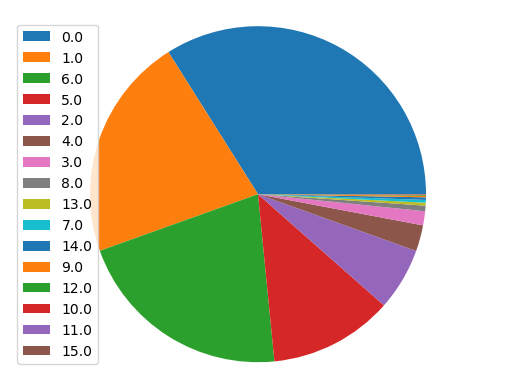

In [98]:
import matplotlib.pyplot as plt

occurrences = df_norm["New Type local"].value_counts()

total = occurrences.sum()
cumulative_percentage = 0

labels = []
sizes = []

for category, count in occurrences.items():
    percentage = (count / total) * 100
    cumulative_percentage += percentage

    labels.append(category)
    sizes.append(percentage)

    print("Catégorie:", category)
    print("Pourcentage:", percentage)
    print("Pourcentage cumulative:", cumulative_percentage)
    print("")

# Plotting the pie chart
plt.pie(sizes, labels=None)
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.

# Adding the legend to the left
plt.legend(labels, loc="center left", bbox_to_anchor=(0.0, 0.5))

plt.show()


In [5]:
valeurs_conservees = [0, 1, 5 ,2, 6]
df_norm["New Type local"] = df_norm["New Type local"].astype(float)
df_norm = df_norm[df_norm["New Type local"].isin(valeurs_conservees)]

df_norm

,Date mutation,Valeur fonciere,Type de voie,Code departement,Nombre de lots,Surface reelle bati,Nombre pieces principales,Nature culture,Surface terrain,New Type local,Somme surfaces Carrez
0,2022-06-20,15000.0,0,53,0,0.000000,0.000,0,0.021611,0.0,0.000000
1,2022-07-28,30000.0,0,53,0,0.000000,0.000,0,0.038458,0.0,0.000000
2,2022-07-09,507000.0,0,32,0,0.095726,0.500,7367,0.005353,5.0,0.000000
3,2022-09-15,170000.0,0,46,0,0.068376,0.375,7367,0.002837,5.0,0.000000
4,2022-03-23,25000.0,0,32,0,0.000000,0.000,0,0.003024,0.0,0.000000
...,...,...,...,...,...,...,...,...,...,...,...
1390692,2022-09-30,250000.0,134,61,1,0.039316,0.250,10979,0.000000,2.0,0.384475
1390693,2022-10-20,298500.0,134,61,2,0.041026,0.250,10979,0.000000,6.0,0.000000
1390694,2022-08-29,330000.0,134,61,2,0.037607,0.250,10979,0.000000,6.0,0.360394
1390695,2022-11-30,113100.0,134,78,3,0.080342,0.375,10979,0.000000,6.0,0.000000


In [6]:
average_surface = df_norm.groupby('New Type local')['Surface reelle bati'].mean()
average_surface

New Type local
0.0    0.000000
1.0    0.082402
2.0    0.041438
5.0    0.089297
6.0    0.052388
Name: Surface reelle bati, dtype: float64

In [7]:
from tqdm import tqdm

df_norm['New Type local'] = df_norm['New Type local'].astype(int)


C:\Users\fchan\AppData\Local\Temp\ipykernel_11848\1776715026.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_norm['New Type local'] = df_norm['New Type local'].astype(int)


# Correlation

C:\Users\fchan\AppData\Local\Temp\ipykernel_11848\1698317074.py:3: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation = df_norm.corr()['Valeur fonciere']


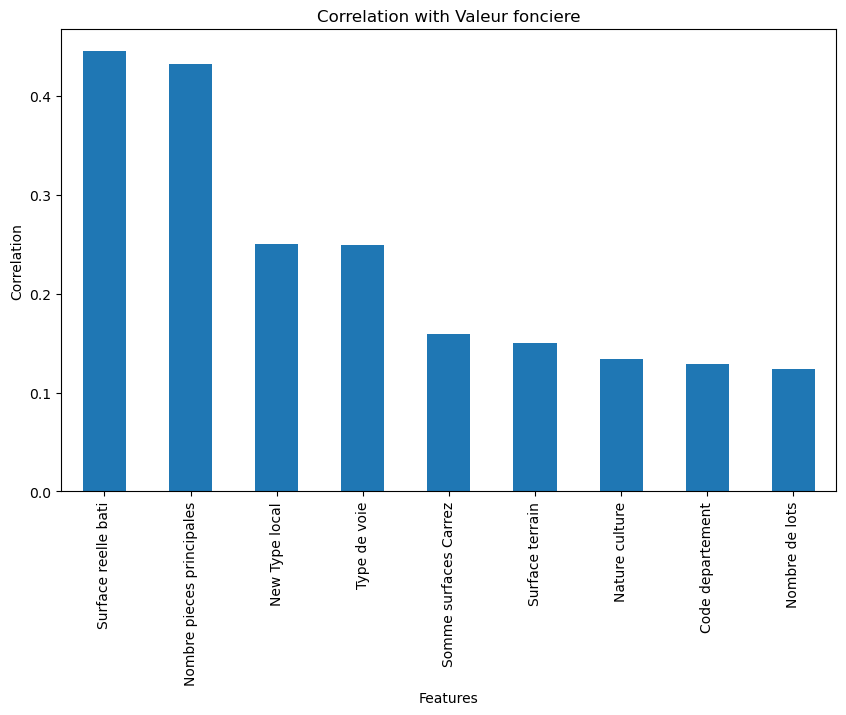

In [10]:
import matplotlib.pyplot as plt 

correlation = df_norm.corr()['Valeur fonciere']

correlation = correlation[correlation.index != 'Valeur fonciere'].abs().sort_values(ascending = False)

plt.figure(figsize=(10, 6))  
correlation.plot(kind='bar')
plt.title('Correlation with Valeur fonciere')
plt.xlabel('Features')
plt.ylabel('Correlation')
plt.show()

In [90]:
low_correlation_features = correlation[correlation < 0.025].index
low_correlation_features

Index([], dtype='object')

C:\Users\fchan\AppData\Local\Temp\ipykernel_11848\2507779761.py:5: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  heatmap = sns.heatmap(df_norm.corr(), vmin=-1, vmax=1, annot=True)


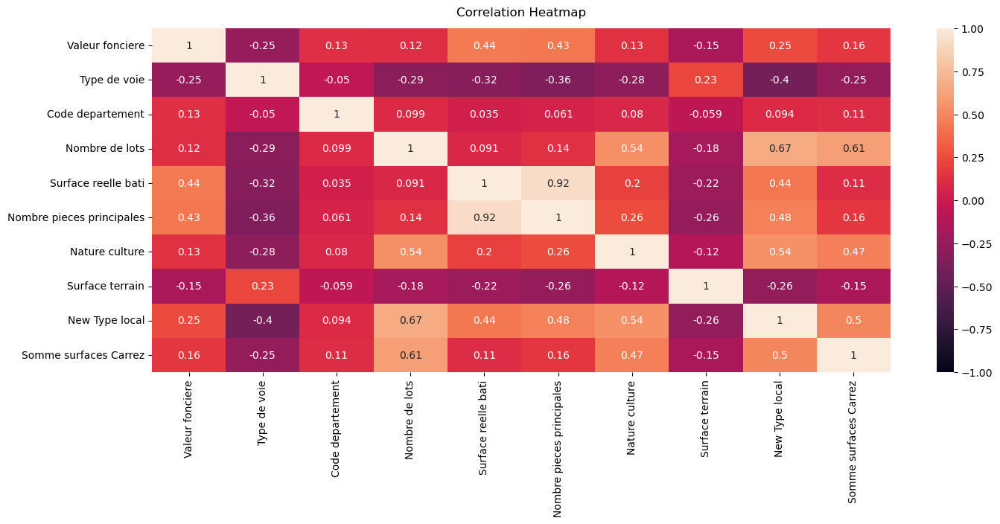

In [12]:
import seaborn as sns 

plt.figure(figsize=(16, 6))

heatmap = sns.heatmap(df_norm.corr(), vmin=-1, vmax=1, annot=True)
heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':12}, pad=12);

# UNSUPERVISED LEARNING

In [4]:
import pandas as pd
df_norm = pd.read_csv("df_norm.csv")

In [5]:
df_norm.columns

Index(['Date mutation', 'Valeur fonciere', 'Nature mutation', 'Type de voie',
       'Code departement', 'Nombre de lots', 'Surface reelle bati',
       'Nombre pieces principales', 'Nature culture', 'Surface terrain',
       'New Type local', 'Somme surfaces Carrez'],
      dtype='object')

In [6]:
# Suppression des colonnes non numériques
grouped_num = df_norm.drop(columns = ['Date mutation','Nature mutation', 'Type de voie',
       'Code departement', 'Nature culture', "New Type local"])
# conservation : valeur fonciere + code postal + nb de lots + nb pieces + surface batie + surface terrain
grouped_num

,Valeur fonciere,Nombre de lots,Surface reelle bati,Nombre pieces principales,Surface terrain,Somme surfaces Carrez
0,330000.0,0,0.098246,0.363636,0.009849,0.000000
1,120000.0,0,0.000000,0.000000,0.000130,0.000000
2,175000.0,0,0.000000,0.000000,0.008503,0.000000
3,220000.0,0,0.000000,0.000000,0.012721,0.000000
4,334860.0,0,0.075088,0.363636,0.005549,0.000000
...,...,...,...,...,...,...
1342142,161000.0,1,0.021053,0.181818,0.000000,0.235931
1342143,181590.0,1,0.020351,0.181818,0.000000,0.212942
1342144,185000.0,1,0.018246,0.181818,0.000000,0.000000
1342145,205000.0,1,0.028070,0.181818,0.000000,0.300119


In [7]:
grouped_num.isnull().any()

Valeur fonciere              False
Nombre de lots               False
Surface reelle bati          False
Nombre pieces principales    False
Surface terrain              False
Somme surfaces Carrez        False
dtype: bool

In [8]:
grouped_num.dtypes

Valeur fonciere              float64
Nombre de lots                 int64
Surface reelle bati          float64
Nombre pieces principales    float64
Surface terrain              float64
Somme surfaces Carrez        float64
dtype: object

In [9]:
import os
os.environ["OMP_NUM_THREADS"] = "1"


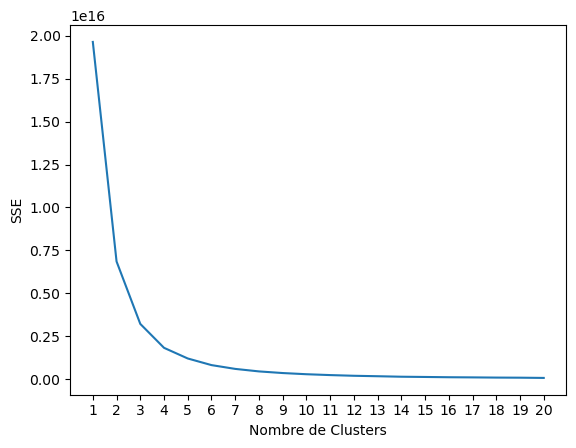

In [10]:
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

# Suppression des colonnes non numériques
grouped_num = df_norm.drop(columns=['Date mutation', 'Nature mutation', 'Type de voie', 'Code departement', 'Nature culture', 'New Type local'])

# Hyperparameter - Determine the best number of clusters
# initialise kmeans parametres
kmeans_kwargs = {
    "init": "random",
    "n_init": 10,
    "random_state": 1,
}

# create list to hold SSE values for each k
sse = []
for k in range(1, 21):
    kmeans = KMeans(n_clusters=k, **kmeans_kwargs)
    kmeans.fit(grouped_num)
    sse.append(kmeans.inertia_)

# visualize results
plt.plot(range(1, 21), sse)
plt.xticks(range(1, 21))
plt.xlabel("Nombre de Clusters")
plt.ylabel("SSE")
plt.show()


In [11]:
kmeans = KMeans(n_clusters=3).fit(grouped_num)

centroids = kmeans.cluster_centers_
print(centroids)

/Users/emma/anaconda3/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


[[1.90369398e+05 8.43079483e-01 5.15003439e-02 2.91240390e-01
  1.92710302e-02 1.13934265e-01]
 [5.49903126e+04 4.77759385e-01 2.26174054e-02 1.31438669e-01
  5.77838509e-02 5.89829771e-02]
 [3.95279721e+05 8.38335756e-01 6.24835601e-02 3.25885233e-01
  2.44399188e-02 1.30426089e-01]]


In [13]:
# Entrainer le modèle
import numpy as np

target = grouped_num['Valeur fonciere']
    # change the dtype to 'int32' to avoid mix of classification metrics
target = target.astype('int32')
y_true = target.values

features = grouped_num.drop('Valeur fonciere', axis=1)
#print(features)
kmeans.fit(features, grouped_num['Valeur fonciere'])
y_pred = kmeans.predict(features)

/Users/emma/anaconda3/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


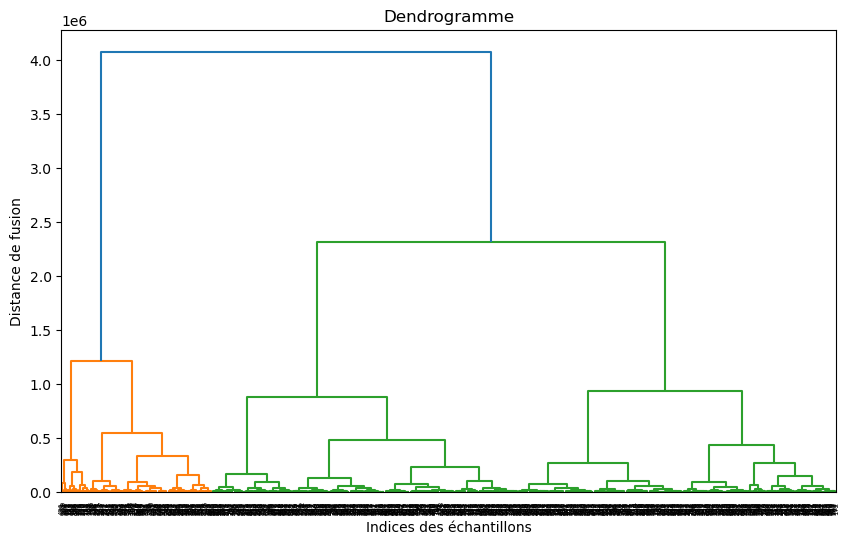

In [14]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import dendrogram, linkage

Z = linkage(grouped_num.head(1000), method='ward')

# Tracé du dendrogramme
plt.figure(figsize=(10, 6))
dendrogram(Z)
plt.title('Dendrogramme')
plt.xlabel('Indices des échantillons')
plt.ylabel('Distance de fusion')
plt.show()

In [15]:
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score

#print(silhouette_score(grouped_num, kmeans.labels_))
print(calinski_harabasz_score(grouped_num, kmeans.labels_))  # + score élevé, + clustering de qualité
print(davies_bouldin_score(grouped_num, kmeans.labels_))  # + score faible, + clustering de qualité

18785.089004565303
5.9509531002718035


# SUPERVISED LEARNING

In [22]:
import sklearn.model_selection as ms

columns_to_keep = df_norm.columns[(df_norm.columns != "Valeur fonciere") & (df_norm.columns != "Date mutation")]

X = df_norm[columns_to_keep]
y = df_norm["Valeur fonciere"]

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = ms.train_test_split(X, y, test_size=0.3, random_state=42)

In [23]:
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier, BaggingRegressor
from sklearn.metrics import r2_score, mean_squared_error, make_scorer
from scipy.stats import spearmanr

randmf = RandomForestRegressor(n_estimators = 20, min_samples_split = 2, min_samples_leaf= 1, max_features = 'sqrt',max_depth= 80, bootstrap=True)
randmf.fit( X_train, y_train)
y_rand_forest = randmf.predict(X_test)
r2_rand_forest = r2_score(y_test, y_rand_forest)
print("R-squared for X (RANDOM FOREST regression):", r2_rand_forest)
rho_rand_forest, p_rand_forest = spearmanr(y_test, y_rand_forest)
print("Spearman for X (RANDOM FOREST regression) rho :", rho_rand_forest, "   p  :", p_rand_forest)
mse_rand_forest = mean_squared_error(y_test, y_rand_forest)
rmse_rand_forest = np.sqrt(mse_rand_forest)
print("RMSE for X (RANDOM FOREST regression):", rmse_rand_forest)

R-squared for X (RANDOM FOREST regression): 0.4168234811332028
Spearman for X (RANDOM FOREST regression) rho : 0.6560297193198945    p  : 0.0
RMSE for X (RANDOM FOREST regression): 111500.12305281365


In [ ]:
# Define colors using hex codes
color1 = "#ff95be"
color2 = "#5ddeb1"

# Plot the actual values in color1
plt.plot(np.linspace(0, len(y_test), len(y_test)), y_test, "o", color=color1, label="Actual Changes")

# Plot the predicted values in color2
plt.plot(np.linspace(0, len(y_rand_forest), len(y_rand_forest)), y_rand_forest, "rx", color=color2, label="Predicted Changes")

# Add a legend and axis labels
plt.legend()
plt.xlabel("Index")
plt.ylabel("Target Value")
plt.show()

In [ ]:
# Define colors using hex codes
color1 = "#ff95be"
color2 = "#5ddeb1"

# Plot the actual values in color1
plt.plot(range(len(y_test)), y_test, color=color1, label="Actual Changes")

# Plot the predicted values in color2
plt.plot(range(len(y_rand_forest)), y_rand_forest, color=color2, label="Predicted Changes")

# Add a legend and axis labels
plt.legend()
plt.xlabel("Index")
plt.ylabel("Target Value")
plt.show()


# PARIS

In [114]:
Paris = df_norm[(df_norm["Code departement"] == 75) & (df_norm["New Type local"] == 2)]

In [127]:
Paris

,Date mutation,Valeur fonciere,Type de voie,Nombre de lots,Surface reelle bati,Nombre pieces principales,Nature culture,Surface terrain,Somme surfaces Carrez
8706,2022-09-26,132000.0,2,1,0.040171,0.250,10979,0.0,0.388944
9377,2022-08-31,124500.0,2,1,0.037607,0.250,10979,0.0,0.365938
9378,2022-08-09,139000.0,2,1,0.044444,0.250,10979,0.0,0.435617
35795,2022-08-02,128000.0,5,2,0.017094,0.125,10979,0.0,0.000000
35796,2022-08-02,135000.0,5,2,0.016239,0.125,10979,0.0,0.000000
...,...,...,...,...,...,...,...,...,...
905483,2022-03-17,78000.0,134,2,0.054701,0.375,10979,0.0,0.542701
939283,2022-01-25,106310.0,134,1,0.023077,0.250,10979,0.0,0.232539
939284,2022-12-15,150630.0,134,1,0.035897,0.250,10979,0.0,0.348891
1052888,2022-02-23,148500.0,134,1,0.033333,0.250,10979,0.0,0.274330


In [115]:
Paris = Paris.drop(["Code departement", "New Type local"],axis = 1)

In [116]:
import sklearn.model_selection as ms

columns_to_keep = Paris.columns[(Paris.columns != "Valeur fonciere") & (Paris.columns != "Date mutation")]

X = Paris[columns_to_keep]
y = Paris["Valeur fonciere"]

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = ms.train_test_split(X, y, test_size=0.3, random_state=42)

In [117]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.ensemble import RandomForestRegressor
import numpy as np 

n_estimators = [5,20,50,100] # number of trees in the random forest
max_features = ['auto', 'sqrt'] # number of features in consideration at every split
max_depth = [int(x) for x in np.linspace(10, 120, num = 12)] # maximum number of levels allowed in each decision tree
min_samples_split = [2, 6, 10] # minimum sample number to split a node
min_samples_leaf = [1, 3, 4] # minimum sample number that can be stored in a leaf node
bootstrap = [True, False] # method used to sample data points


random_grid = {'n_estimators': n_estimators,


'max_features': max_features,


'max_depth': max_depth,


'min_samples_split': min_samples_split,


'min_samples_leaf': min_samples_leaf,


'bootstrap': bootstrap}



# Initializing the Random Forest Regression model with 10 decision trees
rand_forest = RandomForestRegressor()



rf_random = RandomizedSearchCV(estimator = rand_forest,param_distributions = random_grid, n_iter = 100, cv = 5, verbose=2, random_state=35, n_jobs = -1)


# Fitting the Random Forest Regression model to the data
rf_random.fit(X_train, y_train)


print ('Random grid: ', random_grid, '\n')
# print the best parameters
print ('Best Parameters: ', rf_random.best_params_, ' \n')

Fitting 5 folds for each of 100 candidates, totalling 500 fits
Random grid:  {'n_estimators': [5, 20, 50, 100], 'max_features': ['auto', 'sqrt'], 'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120], 'min_samples_split': [2, 6, 10], 'min_samples_leaf': [1, 3, 4], 'bootstrap': [True, False]} 

Best Parameters:  {'n_estimators': 50, 'min_samples_split': 10, 'min_samples_leaf': 3, 'max_features': 'sqrt', 'max_depth': 80, 'bootstrap': True}  



In [119]:
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier, BaggingRegressor
from sklearn.metrics import r2_score, mean_squared_error, make_scorer, mean_absolute_error
from scipy.stats import spearmanr
import numpy as np 

def models_rf_spm(X_train,y_train):
    randm = RandomForestRegressor(n_estimators = 20, min_samples_split = 10, min_samples_leaf= 4, max_features = 'sqrt',max_depth= 50, bootstrap=True)
    randm.fit(X_train, y_train)
    y_rand_forest = randm.predict(X_test)
    
    r2_rand_forest = r2_score(y_test, y_rand_forest)
    rho_rand_forest, p_rand_forest = spearmanr(y_test, y_rand_forest)
    mse_rand_forest = mean_squared_error(y_test, y_rand_forest)
    rmse_rand_forest = np.sqrt(mse_rand_forest)
   

    return y_rand_forest,r2_rand_forest,rho_rand_forest, p_rand_forest,mse_rand_forest,rmse_rand_forest
y_rand_forest,r2_rand_forest,rho_rand_forest, p_rand_forest,mse_rand_forest,rmse_rand_forest = models_rf_spm(X_train,y_train)
print("R-squared for X (RANDOM FOREST regression):", r2_rand_forest)
print("Spearman for X (RANDOM FOREST regression) rho :", rho_rand_forest, "   p  :", p_rand_forest)
print("RMSE for X (RANDOM FOREST regression):", rmse_rand_forest)

R-squared for X (RANDOM FOREST regression): 0.4880518403370623
Spearman for X (RANDOM FOREST regression) rho : 0.6825356452527875    p  : 1.883806696224528e-14
RMSE for X (RANDOM FOREST regression): 53615.195246365016


In [125]:
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier, BaggingRegressor
from sklearn.metrics import r2_score, mean_squared_error, make_scorer, mean_absolute_error
from scipy.stats import spearmanr
import numpy as np 

def models_rf_spm(X_train,y_train):
    randm = RandomForestRegressor(n_estimators = 100, min_samples_split = 10, min_samples_leaf= 1, max_features = 'sqrt',max_depth= 50, bootstrap=False)
    randm.fit(X_train, y_train)
    y_rand_forest = randm.predict(X_test)
    
    r2_rand_forest = r2_score(y_test, y_rand_forest)
    rho_rand_forest, p_rand_forest = spearmanr(y_test, y_rand_forest)
    mse_rand_forest = mean_squared_error(y_test, y_rand_forest)
    rmse_rand_forest = np.sqrt(mse_rand_forest)
   

    return y_rand_forest,r2_rand_forest,rho_rand_forest, p_rand_forest,mse_rand_forest,rmse_rand_forest
y_rand_forest,r2_rand_forest,rho_rand_forest, p_rand_forest,mse_rand_forest,rmse_rand_forest = models_rf_spm(X_train,y_train)
print("R-squared for X (RANDOM FOREST regression):", r2_rand_forest)
print("Spearman for X (RANDOM FOREST regression) rho :", rho_rand_forest, "   p  :", p_rand_forest)
print("RMSE for X (RANDOM FOREST regression):", rmse_rand_forest)

R-squared for X (RANDOM FOREST regression): 0.6238202882050561
Spearman for X (RANDOM FOREST regression) rho : 0.7406268130390277    p  : 6.436032826374911e-18
RMSE for X (RANDOM FOREST regression): 45959.21302205473


In [126]:
diff = y_test - y_rand_forest
print("Mean Error ", diff.mean())
print("Median Error ", diff.median())

Mean Error  5212.391336447995
Median Error  -1224.5814682539785


In [20]:
def optimise_mod(X_train, y_train): 
    n_estimators = [5,20,50,100] # number of trees in the random forest
    max_features = ['auto', 'sqrt'] # number of features in consideration at every split
    max_depth = [int(x) for x in np.linspace(10, 120, num = 12)] # maximum number of levels allowed in each decision tree
    min_samples_split = [2, 6, 10] # minimum sample number to split a node
    min_samples_leaf = [1, 3, 4] # minimum sample number that can be stored in a leaf node
    bootstrap = [True, False] # method used to sample data points
    random_grid = {'n_estimators': n_estimators,
        'max_features': max_features,
        'max_depth': max_depth,
        'min_samples_split': min_samples_split,
        'min_samples_leaf': min_samples_leaf,
        'bootstrap': bootstrap}
    # Initializing the Random Forest Regression model with 10 decision trees
    rand_forest = RandomForestRegressor()
    rf_random = RandomizedSearchCV(estimator = rand_forest,param_distributions = random_grid, n_iter = 100, cv = 5, verbose=2, random_state=35, n_jobs = -1)
    # Fitting the Random Forest Regression model to the data
    rf_random.fit(X_train, y_train)
    print ('Random grid: ', random_grid, '\n')
    # print the best parameters
    print ('Best Parameters: ', rf_random.best_params_, ' \n')

C:\Users\fchan\AppData\Local\Temp\ipykernel_11848\1545710189.py:9: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "rx" (-> color='r'). The keyword argument will take precedence.
  plt.plot(np.linspace(0, len(y_rand_forest), len(y_rand_forest)), y_rand_forest, "rx", color=color2, label="Predicted Changes")


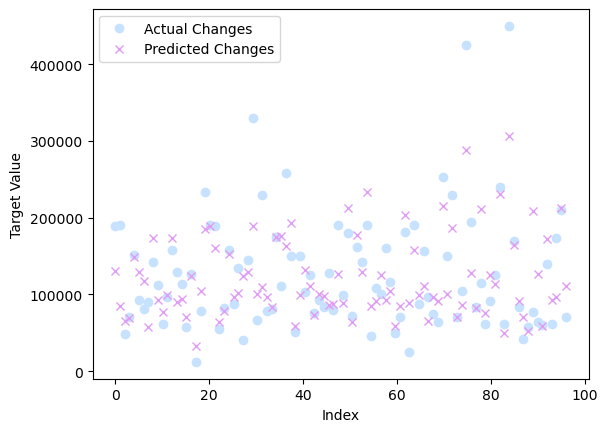

In [87]:
# Define colors using hex codes
color1 = "#c6e2ff"
color2 = "#e19cf6"

# Plot the actual values in color1
plt.plot(np.linspace(0, len(y_test), len(y_test)), y_test, "o", color=color1, label="Actual Changes")

# Plot the predicted values in color2
plt.plot(np.linspace(0, len(y_rand_forest), len(y_rand_forest)), y_rand_forest, "rx", color=color2, label="Predicted Changes")

# Add a legend and axis labels
plt.legend()
plt.xlabel("Index")
plt.ylabel("Target Value")
plt.show()

In [107]:
descTree = DecisionTreeRegressor(max_depth=2, criterion='squared_error', min_samples_leaf= 4)
descTree.fit(X_train, y_train)
y_pred_tree = descTree.predict(X_test)
r2_decTree = r2_score(y_test, y_pred_tree)
print("R-squared for X (DECISION TREE regression):", r2_decTree)
rho_decTree, p_decTree = spearmanr(y_test, y_pred_tree)
print("Spearman for X (DECISION TREE regression) rho :", rho_decTree, "   p  :", p_decTree)
mse = mean_squared_error(y_test, y_pred_tree)
rmse = np.sqrt(mse)
print("RMSE for X (DECISION TREE regression):", rmse)

R-squared for X (DECISION TREE regression): 0.14551275387669893
Spearman for X (DECISION TREE regression) rho : 0.4561593344330361    p  : 1.2898019158183094e-07
RMSE for X (DECISION TREE regression): 54953.41094528768


In [108]:
# Create an instance of a KNN regressor using the best number of neighbors found earlier and fitting it with training data
knn = KNeighborsRegressor(n_neighbors=111).fit(X_train, y_train)

# Make predictions on the test data
predictionsknnr = knn.predict(X_test)

# Compute the r² score and display it
r2_knnr = r2_score(y_test, predictionsknnr)
print("R-squared for X (KNN regression):", r2_knnr)

# Compute the spearman coefficients and display it
rho_knnr, p_knnr = spearmanr(y_test, predictionsknnr)
print("Spearman for X (KNN regression) rho :", rho_knnr, "   p  :", p_knnr)

# Compute the RMSE and display it
rmse_knnr = np.sqrt(mean_squared_error(y_test,predictionsknnr))
print("RMSE for X (KNN regression) :", rmse_knnr)

R-squared for X (KNN regression): 0.06468673656047874
Spearman for X (KNN regression) rho : 0.501937209148227    p  : 3.863186765224629e-09
RMSE for X (KNN regression) : 57493.71981523039


In [109]:
# Create an instance of a Lasso regressor using the best alpha value found earlier and fitting it with training data
las = Lasso(alpha=0).fit(X_train, y_train)

# Make predictions on the test data
predictionslar = las.predict(X_test)

# Compute the r² score and display it
r2_lar = r2_score(y_test, predictionslar)
print("R-squared for X (LASSO regression):", r2_lar)

# Compute the spearman coefficients and display it
rho_lar, p_lar = spearmanr(y_test, predictionslar)
print("Spearman for X (LASSO regression) rho :", rho_lar, "   p  :", p_lar)

# Compute the RMSE and display it
rmse_lar = np.sqrt(mean_squared_error(y_test,predictionslar))
print("RMSE for X (LASSO regression) :", rmse_lar)

R-squared for X (LASSO regression): 0.2522268326305507
Spearman for X (LASSO regression) rho : 0.4563787445182993    p  : 1.269812439962834e-07
RMSE for X (LASSO regression) : 51407.53741330669


In [110]:
# Linear Regression
regressor = LinearRegression()
model = regressor.fit(X_train,y_train)
predictionslr = regressor.predict(X_test)
y_pred_train_lin = regressor.predict(X_train)
r2_lr = r2_score(y_test, predictionslr)
print("R-squared for X (Linear regression) :", r2_lr)
rho_lr, p_lr = spearmanr(y_test, predictionslr)
print("Spearman for X (Linear regression) rho :", rho_lr, "   p  :", p_lr)
rmse_lr = np.sqrt(mean_squared_error(y_test,predictionslr))
print("RMSE for X (Linear regression) :", rmse_lr)


R-squared for X (Linear regression) : 0.25222683263055734
Spearman for X (Linear regression) rho : 0.4563787445182993    p  : 1.269812439962834e-07
RMSE for X (Linear regression) : 51407.53741330646


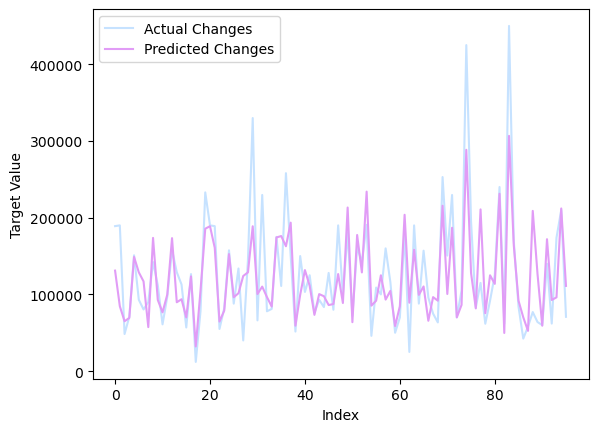

In [88]:
# Define colors using hex codes
color1 = "#c6e2ff"
color2 = "#e19cf6"

# Plot the actual values in color1
plt.plot(range(len(y_test)), y_test, color=color1, label="Actual Changes")

# Plot the predicted values in color2
plt.plot(range(len(y_rand_forest)), y_rand_forest, color=color2, label="Predicted Changes")

# Add a legend and axis labels
plt.legend()
plt.xlabel("Index")
plt.ylabel("Target Value")
plt.show()


In [111]:
y_rand_forest

array([140467.7691288 ,  83509.91758942,  64304.08990259, 132717.77113971,
        55128.39635174,  97397.27537189, 135775.46906934, 115092.46615497,
        60502.47225666, 104267.58899466,  97501.83505608,  92933.0348957 ,
       103407.05250595, 108223.3479178 ,  83053.31200986,  77720.64394111,
       103947.90359929,  72461.43975828, 146549.05333944,  65793.68835886,
       130010.85610536, 103026.27677365,  91060.94650732, 116044.8887763 ,
        88980.24547747, 103964.1362436 ,  87505.05654016, 134122.42603065,
        88321.18952936, 118025.46695665, 130398.51745728,  98226.91372936,
        59149.11947115, 103407.05250595,  64402.3639111 , 112484.03426891,
        61239.16703747,  60940.20447332, 108831.63345564,  62194.58423938,
        85714.45422236,  64402.3639111 ,  80032.02855649, 148559.95463932,
       147607.95960689, 133954.92369133,  52528.53719423,  63047.6764111 ,
       113696.6344564 , 149455.92577853, 103407.05250595, 104035.76496597,
       150690.7326299 , 1